<a href="https://colab.research.google.com/github/thiagocquinto/datascience/blob/main/MVP2_Thiago_Quinto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#MVP de Machine Learning & Analytics

**Thiago Correa do Quinto**

##1. Modelo utilizando métodos clássicos para um problema de classificação(MVP 2.a)

O conjunto dados utilizado neste projeto é **Heart Attack Analysis & Prediction Dataset** muito usado para a tarefa de classificação e previsão de ataques cardíacos. Ele contém informações médicas relevantes e características de pacientes que foram coletadas para fins de análise e previsão de ataques cardíacos.

A análise e previsão de ataques cardíacos são cruciais para a saúde pública, pois permitem a implementação de medidas preventivas e intervenções médicas precoces para reduzir o risco de eventos cardiovasculares graves.

O objetivo deste projeto é criar um modelo de classificação capaz de prever se um paciente está em risco de sofrer um ataque cardíaco com base nas características fornecidas.

Características (Features):

**Age** : Idade do paciente

**Sex** : Sexo do paciente

**exang**: angina induzida por atividade física (1 = sim; 0 = não)

**caa**: número de vasos principais (0-3)

**cp** : Tipo de dor no peito

>*Valor 1*: angina típica

>*Valor 2*: angina atípica

>*Valor 3*: dor não anginosa

>*Valor 4*: assintomático

**trtbps** : pressão arterial em repouso (em mm Hg)

**chol** : colesterol em mg/dl medido via sensor IMC

**fbs** : (açúcar no sangue em jejum > 120 mg/dl) (1 = verdadeiro; 0 = falso)

**rest_ecg** : resultados eletrocardiográficos em repouso

>*Valor 0*: normal

>*Valor 1*: tendo anormalidade da onda ST-T (inversões da onda T e/ou elevação ou depressão ST > 0,05 mV)

>*Valor 2*: mostrando hipertrofia ventricular esquerda provável ou definitiva pelos critérios de Estes

**thalach** : frequência cardíaca máxima alcançada

**old peak**:  depressão do ST induzida pelo exercício em relação ao repouso

**slp**: a inclinação do pico do segmento ST do exercício

>*0* = sem inclinação

>*1* = plano

>*2* = descendente

**thall**: talassemia

>*0* = nulo

>*1* = defeito fixo

>*2* = normais

>*3* = defeito reversível

**target** :
>*0* = menor chance de ataque cardíaco

>*1* = grande chance de ataque cardíaco

Fonte: O conjunto de dados pode ser originado de várias fontes, incluindo repositórios de dados abertos, como Kaggle (https://www.kaggle.com/datasets/rashikrahmanpritom/heart-attack-analysis-prediction-dataset).

In [53]:
# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

In [54]:
# Importação de bibliotecas necessárias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import accuracy_score

from sklearn.pipeline import Pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier # algoritmo Árvore de Regressão
from sklearn.neighbors import KNeighborsClassifier # algoritmo KNN
from sklearn.naive_bayes import GaussianNB # algoritmo Naive Bayes
from sklearn.svm import SVC # algoritmo SVM

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier # ExtraTrees, para a importância de Atributos
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import KFold

from sklearn.feature_selection import SelectKBest # para a seleção univariada
from sklearn.feature_selection import f_classif # para o teste ANOVA da seleção univariada
from sklearn.feature_selection import RFE # para a Eliminação Recursiva de atributos
from sklearn.linear_model import LogisticRegression # Regressão Logística, para a eliminação recursiva de atributos

###1. Carga de Dados

In [55]:
# importando dados de url para um dataframe

# url a importar
url_dados='https://raw.githubusercontent.com/thiagocquinto/datasets/main/heart.csv'

dataset=pd.read_csv(url_dados, delimiter=',')

display(dataset.head()) # foram carregadas 5 linhas para ter uma visão melhor dos dados do dataset

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


###2. Análise dos Dados

In [56]:
print(dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trtbps    303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalachh  303 non-null    int64  
 8   exng      303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slp       303 non-null    int64  
 11  caa       303 non-null    int64  
 12  thall     303 non-null    int64  
 13  output    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB
None


Dataset com dimensão de 303 linhas por 14 colunas

In [57]:
dataset.describe()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


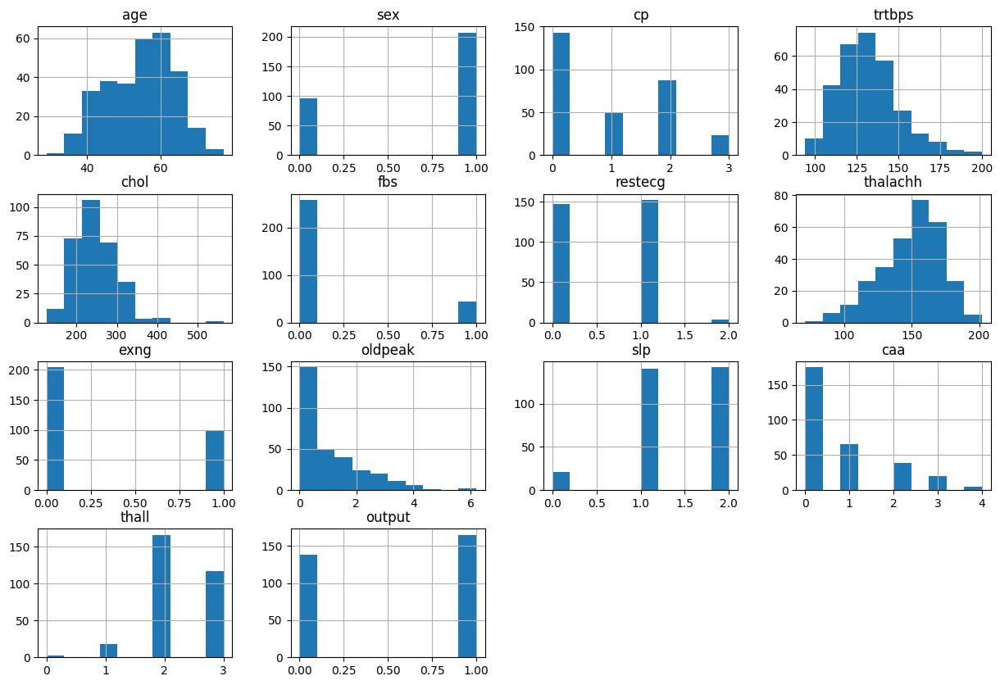

In [58]:
dataset.hist(figsize = (15,10));

As colunas age, trtbps, chol,thalachh e oldpeak apresentam distribuição de dados com valores discretos enquanto os as outras colunas apresentam dados categóricos. Há um ligeiro desbalanceamento na variável de saída output.

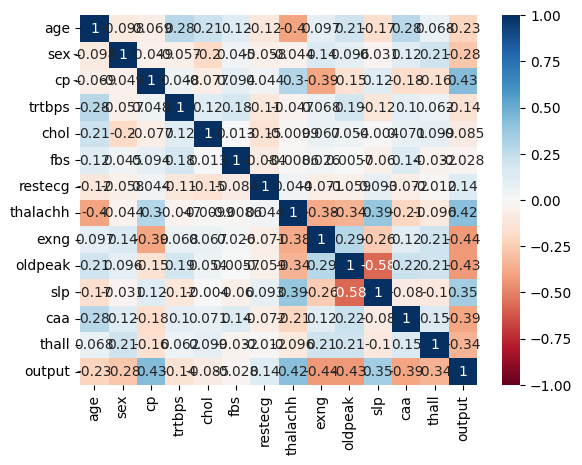

In [59]:
# Matriz de Correlação com Matplotlib Seaborn - mudança de escala de cores entre -1 e 1
sns.heatmap(dataset.corr(), annot=True, cmap='RdBu',vmin=-1, vmax=1);

In [60]:
# verificando nulls no dataset
dataset.isnull().sum()

age         0
sex         0
cp          0
trtbps      0
chol        0
fbs         0
restecg     0
thalachh    0
exng        0
oldpeak     0
slp         0
caa         0
thall       0
output      0
dtype: int64

O dataset não possui valores nulos, não sendo necessário nenhum tratamento de missings

###3. Pré-processamento dos dados

In [61]:
# Preparação dos dados

# Separação em bases de treino e teste (holdout)
array=dataset.values
X=array[:,0:13] # atributos
y=array[:,13] # classe (target)

In [62]:
# SelectKBest

# Seleção de atributos com SelectKBest
best_var = SelectKBest(score_func=f_classif,k=7)

# Executa a função de pontuação em (X,y) e obtém os atributos selecionados
fit = best_var.fit(X,y)

# Reduz X para os atributos selecionados
features=fit.transform(X)

# Resultados
print('\nNúmero original de atributos: ', X.shape[1])
print('\nNúmero reduzido de atributos: ', features.shape[1])

# Exibe os atributos originais
print('\nAtributos Originais: ', dataset.columns[0:13])

# Exibe as pontuações de cada atributo e os 4 escolhidos (com as pontuações mais altas)
np.set_printoptions(precision=3) # 3 casas decimais
print('\nScores dos Atributos Originais: ', fit.scores_)
print('\nAtributos Selecionados: ', best_var.get_feature_names_out(input_features=dataset.columns[0:13]))


Número original de atributos:  13

Número reduzido de atributos:  7

Atributos Originais:  Index(['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh',
       'exng', 'oldpeak', 'slp', 'caa', 'thall'],
      dtype='object')

Scores dos Atributos Originais:  [16.117 25.792 69.772  6.458  2.203  0.237  5.777 65.12  70.952 68.551
 40.902 54.56  40.408]

Atributos Selecionados:  ['cp' 'thalachh' 'exng' 'oldpeak' 'slp' 'caa' 'thall']


In [63]:
# Eliminação Recursiva de Atributos

# Criação do modelo
modelo=LogisticRegression(max_iter=200)

# Eliminação Recursiva de Atributos
rfe=RFE(modelo,n_features_to_select=7)
fit=rfe.fit(X,y)

# Print dos resultados
print('Atributos Originais: ', dataset.columns[0:13])

# Exibe os atributos selecionados (marcados como True em 'Atributos Selecionados')
# e com valor 1 em 'Ranking dos Atributos')
print('\nAtributos Selecionados: %s' % fit.support_)
print('\nRanking de atributos: %s' % fit.ranking_)
print('\nQtd de melhores Atributos: %d' % fit.n_features_)
print('\nNomes dos Atributos Selecionados: %s' % fit.get_feature_names_out(input_features=dataset.columns[0:13]))

Atributos Originais:  Index(['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh',
       'exng', 'oldpeak', 'slp', 'caa', 'thall'],
      dtype='object')

Atributos Selecionados: [False  True  True False False False False False  True  True  True  True
  True]

Ranking de atributos: [6 1 1 5 7 3 2 4 1 1 1 1 1]

Qtd de melhores Atributos: 7

Nomes dos Atributos Selecionados: ['sex' 'cp' 'exng' 'oldpeak' 'slp' 'caa' 'thall']


Ambos os critérios utilizados para redução de atributos quase convergiram para as mesmas colunas. Nessa seleção somente a coluna sex e thalachh diverge em cada técnica.

In [64]:
# Importância de Atributos com ExtraTrees

# Criação do modelo para seleção de atributos
modelo=ExtraTreesClassifier(n_estimators=100)
modelo.fit(X,y)

# Exibe os atributos originais
print('\nAtributos Originais: ', dataset.columns[0:13])

# Exibe a pontuação de importância para cada atributo (quanto maior a pontuação mais importante é o atributo)
print(modelo.feature_importances_)


Atributos Originais:  Index(['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh',
       'exng', 'oldpeak', 'slp', 'caa', 'thall'],
      dtype='object')
[0.067 0.054 0.132 0.064 0.061 0.019 0.036 0.087 0.091 0.098 0.069 0.122
 0.099]


Pelo resultado da importância de atributos, a técnica mais aderente foi a Eliminação Recursiva de Atributos.

#### Separação de conjunto de treino e teste

In [65]:
test_size=0.20 # tamanho do conjunto de teste
seed=7 # semente aleatória

# Separação em conjuntos de treino e teste
array=dataset.values
X=array[:,0:13]
y=array[:,13]
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=test_size,shuffle=True, random_state=seed,stratify=y) # holdout com estratificação

# Parâmetros e partições da validação cruzada
scoring='accuracy'
num_particoes=10
kfold=StratifiedKFold(n_splits=num_particoes,shuffle=True,random_state=seed) # validação cruzada com estratificação

####Modelos e Parâmetros de Votação

In [66]:
np.random.seed(7) # definindo uma semente global

# Lista que armazenará o modelo
models=[]

# Criando os modelos e adicionando-os na lista de modelos
models.append(('LR',LogisticRegression(max_iter=200)))
models.append(('KNN',KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB',GaussianNB()))
models.append(('SVM',SVC()))

# Definindo os parâmetros do classificador base para o BaggingClassifier
base=DecisionTreeClassifier()
num_trees=100
max_features=3

# Criando os modelos para o VotingClassifier
bases=[]
model1=LogisticRegression(max_iter=200)
bases.append(('logistic',model1))
model2=DecisionTreeClassifier()
bases.append(('cart',model2))
model3=SVC()
bases.append(('svm',model3))

####Pipeline

In [67]:
# Listas para armazenar os pipelines e os resultados para todas as visões do dataset
pipelines=[]
results=[]
names=[]

# Criando os elementos do pipeline

# Algoritmos que serão utilizados
reg_log=('LR',LogisticRegression(max_iter=200))
knn=('KNN',KNeighborsClassifier())
cart=('CART', DecisionTreeClassifier())
naives_bayes=('NB',GaussianNB())
svm=('SVM',SVC())
bagging=('Bagging',BaggingClassifier(base_estimator=base,n_estimators=num_trees))
random_forest=('RF',RandomForestClassifier(n_estimators=num_trees,max_features=max_features))
extra_trees=('ET',ExtraTreesClassifier(n_estimators=num_trees,max_features=max_features))
adaboost=('Ada',AdaBoostClassifier(n_estimators=num_trees))
gradient_boosting=('GB',GradientBoostingClassifier(n_estimators=num_trees))
voting=('Voting',VotingClassifier(bases))

# Transformações que serão utilizadas
standard_scaler=('StandardScaler',StandardScaler())
min_max_scaler=('MinMaxScaler',MinMaxScaler())


LR-orig: 0.838667 (0.051228)
KNN-orig: 0.636333 (0.084741)
CART-orig: 0.793333 (0.078436)
NB-orig: 0.826000 (0.100519)
SVM-orig: 0.636167 (0.078881)
Bag-orig: 0.809833 (0.083837)
RF-orig: 0.821833 (0.065547)
ET-orig: 0.821500 (0.091940)
Ada-orig: 0.764167 (0.100836)
GB-orig: 0.813833 (0.077796)
Vot-orig: 0.793167 (0.062323)
LR-padr: 0.822167 (0.059414)
KNN-padr: 0.809500 (0.072999)
CART-padr: 0.784833 (0.064706)
NB-padr: 0.826000 (0.100519)
SVM-padr: 0.825500 (0.093369)
Bag-padr: 0.830167 (0.092510)
RF-padr: 0.822333 (0.055853)
ET-padr: 0.829833 (0.076178)
Ada-padr: 0.764167 (0.100836)
GB-padr: 0.809667 (0.086226)
Vot-padr: 0.822000 (0.053587)
LR-norm: 0.817667 (0.084466)
KNN-norm: 0.829667 (0.071553)
CART-norm: 0.789000 (0.086747)
NB-norm: 0.826000 (0.100519)
SVM-norm: 0.846167 (0.087775)
Bag-norm: 0.805333 (0.097228)
RF-norm: 0.826333 (0.076568)
ET-norm: 0.813167 (0.099612)
Ada-norm: 0.764167 (0.100836)
GB-norm: 0.805500 (0.089935)
Vot-norm: 0.826000 (0.069969)


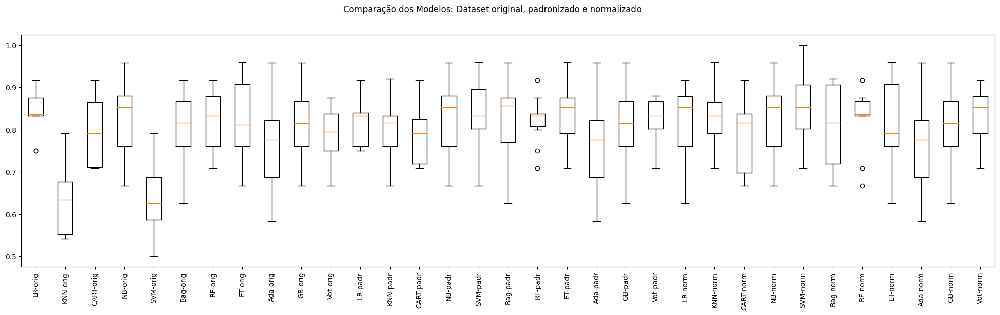

In [68]:
# Montando os pipelines

# Dataset original
pipelines.append(('LR-orig',Pipeline([reg_log])))
pipelines.append(('KNN-orig',Pipeline([knn])))
pipelines.append(('CART-orig',Pipeline([cart])))
pipelines.append(('NB-orig',Pipeline([naives_bayes])))
pipelines.append(('SVM-orig',Pipeline([svm])))
pipelines.append(('Bag-orig',Pipeline([bagging])))
pipelines.append(('RF-orig',Pipeline([random_forest])))
pipelines.append(('ET-orig',Pipeline([extra_trees])))
pipelines.append(('Ada-orig',Pipeline([adaboost])))
pipelines.append(('GB-orig',Pipeline([gradient_boosting])))
pipelines.append(('Vot-orig',Pipeline([voting])))

# Dataset padronizado
pipelines.append(('LR-padr',Pipeline([standard_scaler,reg_log])))
pipelines.append(('KNN-padr',Pipeline([standard_scaler,knn])))
pipelines.append(('CART-padr',Pipeline([standard_scaler,cart])))
pipelines.append(('NB-padr',Pipeline([standard_scaler,naives_bayes])))
pipelines.append(('SVM-padr',Pipeline([standard_scaler,svm])))
pipelines.append(('Bag-padr',Pipeline([standard_scaler,bagging])))
pipelines.append(('RF-padr',Pipeline([standard_scaler,random_forest])))
pipelines.append(('ET-padr',Pipeline([standard_scaler,extra_trees])))
pipelines.append(('Ada-padr',Pipeline([standard_scaler,adaboost])))
pipelines.append(('GB-padr',Pipeline([standard_scaler,gradient_boosting])))
pipelines.append(('Vot-padr',Pipeline([standard_scaler,voting])))

# Dataset normalizado
pipelines.append(('LR-norm',Pipeline([min_max_scaler,reg_log])))
pipelines.append(('KNN-norm',Pipeline([min_max_scaler,knn])))
pipelines.append(('CART-norm',Pipeline([min_max_scaler,cart])))
pipelines.append(('NB-norm',Pipeline([min_max_scaler,naives_bayes])))
pipelines.append(('SVM-norm',Pipeline([min_max_scaler,svm])))
pipelines.append(('Bag-norm',Pipeline([min_max_scaler,bagging])))
pipelines.append(('RF-norm',Pipeline([min_max_scaler,random_forest])))
pipelines.append(('ET-norm',Pipeline([min_max_scaler,extra_trees])))
pipelines.append(('Ada-norm',Pipeline([min_max_scaler,adaboost])))
pipelines.append(('GB-norm',Pipeline([min_max_scaler,gradient_boosting])))
pipelines.append(('Vot-norm',Pipeline([min_max_scaler,voting])))

# Executando os pipelines
for name, model in pipelines:
  cv_results=cross_val_score(model,X_train,y_train,cv=kfold,scoring=scoring)
  results.append(cv_results)
  names.append(name)
  msg= '%s: %f (%f)' % (name,cv_results.mean(),cv_results.std())
  print(msg)

# Boxplot de comparação dos modelos
fig=plt.figure(figsize=(25,6))
fig.suptitle('Comparação dos Modelos: Dataset original, padronizado e normalizado')
ax= fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names,rotation=90)
plt.show()

Podemos perceber que após a validação cruzada, o melhor classificador foi o SVM-norm com 0.846167 de acurácia. Este classificador seguirá para a etapa de Tuning

####Tunning do Classificador

In [69]:
# Tuning do SVC
np.random.seed(7) # definindo semente global para este bloco

pipelines=[]

# Definindo os componentes do pipeline
svm=('SVM',SVC())
standard_scaler=('StandardScaler',StandardScaler())
min_max_scaler=('MinMaxScaler',MinMaxScaler())

pipelines.append(('SVM-orig',Pipeline([svm])))
pipelines.append(('SVM-padr',Pipeline([standard_scaler,svm])))
pipelines.append(('SVM-norm',Pipeline([min_max_scaler,svm])))

param_grid={
    'SVM__C': [0.1, 1, 10, 100, 1000],
    'SVM__gamma': [1, 0.1, 0.01, 0.001, 0.0001],
    'SVM__kernel': ['rbf','sigmoid']
}

# Prepara e executa o GridSearchCV
for name, model in pipelines:
  grid=GridSearchCV(estimator=model,param_grid=param_grid,scoring=scoring,cv=kfold)
  grid.fit(X_train,y_train)
  #imprime a melhor configuração
  print('Sem tratamento de missings: %s - Melhor: %f usando %s' % (name,grid.best_score_, grid.best_params_))

Sem tratamento de missings: SVM-orig - Melhor: 0.780500 usando {'SVM__C': 100, 'SVM__gamma': 0.0001, 'SVM__kernel': 'rbf'}
Sem tratamento de missings: SVM-padr - Melhor: 0.830333 usando {'SVM__C': 1000, 'SVM__gamma': 0.001, 'SVM__kernel': 'sigmoid'}
Sem tratamento de missings: SVM-norm - Melhor: 0.846333 usando {'SVM__C': 1, 'SVM__gamma': 1, 'SVM__kernel': 'rbf'}


Os melhores parâmetros para o SVM foi o utilizado no SVM-norm: C: 1; gamma: 1 e kernel: rbf

####Avaliação do Conjunto teste

In [75]:
# Avaliação do modelo com conjunto de teste

# Preparação do modelo
scaler=MinMaxScaler().fit(X_train) # ajuste do scaler com o conjunto de treino
rescaledX=scaler.transform(X_train) # aplicação da padronização no conjunto de treino
model=SVC(C=1,gamma=1,kernel='rbf')
model.fit(rescaledX,y_train)

# Estimativa da acurácia no conjunto de teste
rescaledTestX=scaler.transform(X_test) # aplicação da padronização no conjunto de teste
predictions=model.predict(rescaledTestX)
print(accuracy_score(y_test,predictions))

0.819672131147541


In [76]:
# Matriz de Confusão
confusion_matrix(y_test,predictions)

array([[20,  8],
       [ 3, 30]])

Por se tratar de um conjunto de dados muito sensível, onde falsos positivos podem impactar um diagnóstico assertivo, a matriz de confusão demonstra que o modelo tem uma boa aderência associada a uma acurácia de 0.8197.

##2. Modelo utilizando Deep Learning para um problema de visão computacional (MVP 2.b)

O conjunto de dados "Natural Human Face Images for Emotion Recognition" é um dataset utilizado em problemas de visão computacional e tem como objetivo reconhecer emoções em rostos humanos. Ele contém imagens de rostos de pessoas em diferentes emoções, capturadas em condições naturais. Esse tipo de dataset é amplamente utilizado em pesquisas relacionadas à detecção e reconhecimento de emoções em imagens.

O reconhecimento de expressões faciais geralmente usa conjuntos de dados padrão como FER, CK+ e KDEF para aprendizado de máquina. Aqui está uma tentativa de fornecer dados adicionais para rostos humanos reais coletados na Internet e anotados manualmente.

São mais de 5.500 imagens com 8 categorias de emoções – raiva, desprezo, nojo, medo, felicidade, neutralidade, tristeza e surpresa. Todas as imagens contêm rosto humano em tons de cinza (ou esboço). Cada imagem tem 224 x 224 pixels em escala de cinza no formato PNG.

O reconhecimento de emoções em imagens de rostos humanos é uma tarefa desafiadora e importante em visão computacional. Essa habilidade é valiosa em aplicações como atendimento ao cliente, detecção de estresse e emoções em ambientes de trabalho, interações de robôs com humanos e análise de reações de consumidores em resposta a campanhas publicitárias, entre outras.

Fonte: O conjunto de dados pode ser proveniente de várias fontes, incluindo repositórios públicos, bancos de dados de pesquisa ou coletas de dados específicas para estudos de emoção em imagens de rostos humanos no kaggle (https://www.kaggle.com/datasets/sudarshanvaidya/random-images-for-face-emotion-recognition).

In [1]:
!pip install gdown # instala pacote do gdown para realizar download de arquivo no Google Drive

In [2]:
# importar bibliotecas

from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing import image
import os
import gdown
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display
from keras import regularizers
from keras.optimizers import Adam

In [3]:
# Utilidades
# plot_confusion_matrix é uma função python que imprime uma matriz de confusão

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

###1. Carga de Dados

In [4]:
file_id = "11ZvtedV401A3y2BFvCZcqd7fwPfuZCM_"
url = f"https://drive.google.com/uc?id={file_id}"

folder_path = "./dataset"  # especifique a pasta onde baixara o arquivo
os.makedirs(folder_path, exist_ok=True) # cria a pasta de destino se necessário

output = "dataset/emotions.zip"  # especifique o nome do arquivo e a extensão do mesmo
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?id=11ZvtedV401A3y2BFvCZcqd7fwPfuZCM_
To: /content/dataset/emotions.zip
100%|██████████| 47.8M/47.8M [00:01<00:00, 26.5MB/s]


'dataset/emotions.zip'

In [5]:
# Path onde se encontra o arquivo 'emotions.zip'
train = 'dataset/emotions.zip'
destination = 'dataset/images/'

# Criando a pasta de destino se necessário
os.makedirs(destination,exist_ok=True)

# descompactação do arquivo emotions.zip na pasta de destino
with zipfile.ZipFile(train,'r') as zip_ref:
    zip_ref.extractall(destination)

###2. Análise dos Dados

In [6]:
# verifica a pasta de destino, focado no subdiretórios
subdir=os.listdir(destination)
print(subdir)

['sadness', 'fear', 'neutrality', 'anger', 'happiness', 'disgust', 'surprise', 'contempt']


In [7]:
# verifica cada subdiretório e conta quantos arquivos para cada pasta
for sub in subdir:
  print(sub+": "+str(len((os.listdir(destination+'/'+sub)))))

sadness: 746
fear: 570
neutrality: 524
anger: 890
happiness: 1406
disgust: 439
surprise: 775
contempt: 208


In [8]:
# construção de dataset com os dados dos arquivos
images, paths, labels, heights, widths, filesize = [], [], [], [], [],[]

for sub in subdir:
  path = destination+sub
  files = os.listdir(path)

  # Loop que percorre cada uma das imagens extraídas
  for fname in files:
      images.append(fname)
      paths.append(path+'/')
      labels.append(sub)
      img_shape = mpimg.imread(path+'/'+fname).shape
      heights.append(img_shape[0])
      widths.append(img_shape[1])
      filesize.append(os.path.getsize(path+'/'+fname))

      # copia os as imagens de cada subdiretório para o diretório de destino
      shutil.copy2(os.path.join(path, fname), destination)

# Criação do dataset
df = pd.DataFrame({'image': images, 'path': paths, 'class': labels,
                   'height': heights,'width': widths,  'filesize': filesize})

In [9]:
# visualização do dataset
df.head()

,image,path,class,height,width,filesize
0,images - 2020-11-06T201618.925_face.png,dataset/images/sadness/,sadness,224,224,15539
1,31549147738_fe99890010_b_face.png,dataset/images/sadness/,sadness,224,224,32004
2,images - 2020-11-06T201604.022_face.png,dataset/images/sadness/,sadness,224,224,12558
3,images - 2020-11-06T195236.984_face.png,dataset/images/sadness/,sadness,224,224,4267
4,images - 2020-11-06T181828.625_face.png,dataset/images/sadness/,sadness,224,224,5750


happiness     1406
anger          890
surprise       775
sadness        746
fear           570
neutrality     524
disgust        439
contempt       208
Name: class, dtype: int64


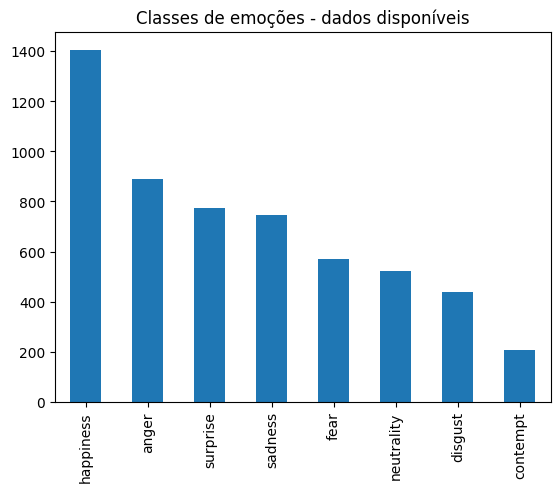

In [10]:
# avaliação dos dados através do dataset
print((df['class']).value_counts())
emotions_count = df['class'].value_counts().plot.bar(title='Classes de emoções - dados disponíveis')

Como podemos perceber, o dataset possui um desbalanceamento para cada classe, o que pode dificultar o treinamento do modelo.

###3. Pré-processamento dos dados

In [12]:
# parâmetros básicos que serão utilizados
batch_size = 32
img_height = 224
img_width = 224
num_classes = 8

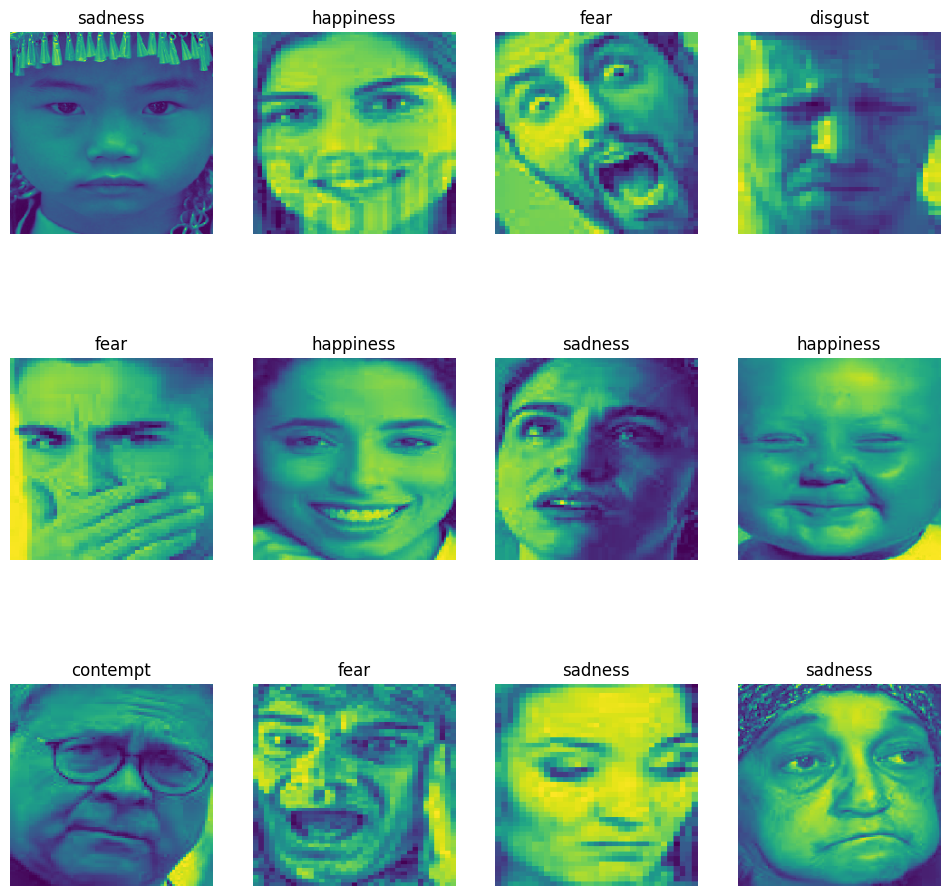

In [13]:
# Pré-visualização das imagens
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = df.sample()
    img_path =sample['path'].values+'/'+sample['image'].values
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path[0])
    plt.imshow(img)
    plt.title(sample['class'].values[0])

plt.show()

####Separação de conjunto de treino, validação e teste

In [14]:
train, test =train_test_split(df[['image' ,'path', 'class']] ,test_size=0.3 ,random_state=42 , stratify=df['class'],shuffle=True)

In [15]:
train_datagen=ImageDataGenerator(validation_split=0.2, #inclusa a divisão para validação
                                 rescale = 1.0/255,
                                 rotation_range=40,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 horizontal_flip=True,
                                 fill_mode='nearest'
                                 )

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode = "grayscale",
    class_mode='categorical',
    directory=destination,
    x_col='image',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode = "grayscale",
    class_mode='categorical',
    directory=destination,
    x_col='image',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    directory=destination,
    color_mode = "grayscale",
    class_mode='categorical',
    x_col='image',
    y_col='class',)

Found 3112 validated image filenames belonging to 8 classes.
Found 778 validated image filenames belonging to 8 classes.
Found 1668 validated image filenames belonging to 8 classes.


In [16]:
# verificação da ordem das classes para o modelo
test_generator.class_indices

{'anger': 0,
 'contempt': 1,
 'disgust': 2,
 'fear': 3,
 'happiness': 4,
 'neutrality': 5,
 'sadness': 6,
 'surprise': 7}

Found 1 validated image filenames belonging to 1 classes.


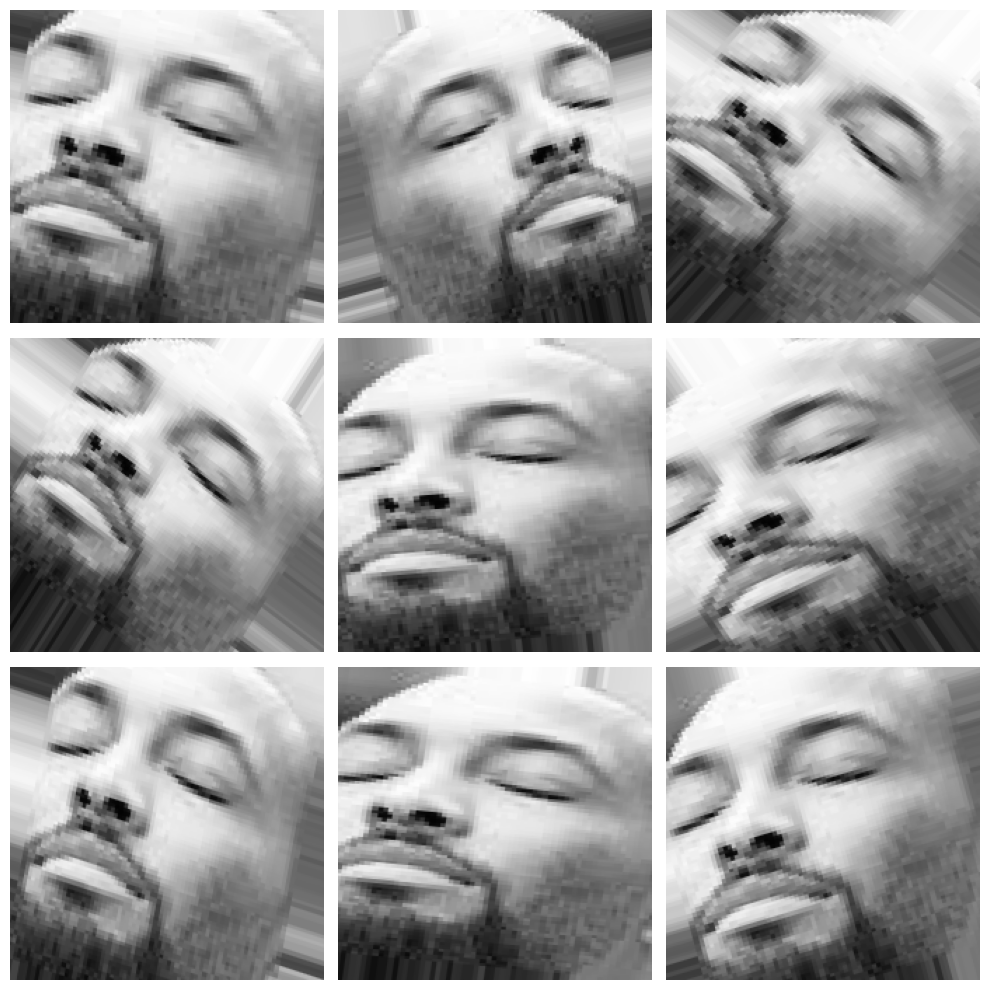

In [17]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    destination,
    x_col='image',
    y_col='class',
    target_size=(img_height, img_width),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

####Arquitetura do Modelo de Rede Neural Convulacional (CNN) para *Deep Learning*

Aqui é especificada uma camada convolucional 2D que possui 64 filtros e usa a função de ativação ReLU. O parâmetro input_shape define a forma das imagens de entrada para a rede. Na sequência é adicionada uma camada softmax com o número de classes a ser previsto.

In [18]:
model = keras.models.Sequential([
    keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(img_height,img_width,1)),
    keras.layers.MaxPooling2D((2,2)),
    keras.layers.Conv2D(128, (3,3), activation='relu'),
    keras.layers.MaxPooling2D((2,2)),
    #keras.layers.Conv2D(192, (3,3), activation='relu'),
    #keras.layers.MaxPooling2D((2,2)),
    keras.layers.Conv2D(256, (3,3), activation='relu'),
    keras.layers.MaxPooling2D((2,2)),
    keras.layers.Flatten(),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(512, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(num_classes, activation='softmax')
])

In [19]:
"""
model= keras.models.Sequential([
    keras.layers.Conv2D(32, kernel_size=(3, 3), padding='same', activation='relu', input_shape=(img_height,img_width,1)),
    keras.layers.Conv2D(64,(3,3), padding='same', activation='relu' ),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.Dropout(0.25),
    keras.layers.Conv2D(128,(5,5), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(512,(3,3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(512,(3,3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.Dropout(0.25),

    keras.layers.Flatten(),
    keras.layers.Dense(256,activation = 'relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Dense(512,activation = 'relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Dense(8, activation='softmax')
])
"""

"\nmodel= keras.models.Sequential([\n    keras.layers.Conv2D(32, kernel_size=(3, 3), padding='same', activation='relu', input_shape=(img_height,img_width,1)),\n    keras.layers.Conv2D(64,(3,3), padding='same', activation='relu' ),\n    keras.layers.BatchNormalization(),\n    keras.layers.MaxPool2D(pool_size=(2, 2)),\n    keras.layers.Dropout(0.25),\n    keras.layers.Conv2D(128,(5,5), padding='same', activation='relu'),\n    keras.layers.BatchNormalization(),\n    keras.layers.MaxPool2D(pool_size=(2, 2)),\n    keras.layers.Dropout(0.25),\n    \n    keras.layers.Conv2D(512,(3,3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),\n    keras.layers.BatchNormalization(),\n    keras.layers.MaxPool2D(pool_size=(2, 2)),\n    keras.layers.Dropout(0.25),\n    \n    keras.layers.Conv2D(512,(3,3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),\n    keras.layers.BatchNormalization(),\n    keras.layers.MaxPool2D(pool_size=(2, 2)),\n    keras

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 64)      640       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 128)     73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 256)       295168    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 256)      0

####Treinamento do Modelo Deep Learning

Compilação do modelo Keras com as configurações do treinamento.

optimizer='adam': especifica o otimizador a ser usado durante o treinamento.

loss='categorical_crossentropy': especifica a função de perda a ser usada durante o treinamento. Para problemas de classificação multiclasse, onde a variável alvo tem mais de duas categorias, a perda categórica de entropia cruzada é freqüentemente empregada.

metrics=['accuracy']: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [21]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

epochs = 20 define o número de épocas de treinamento para o modelo. Uma época representa uma passagem completa por todo o conjunto de dados de treinamento.

Já o método fit() inicia o processo de treinamento do modelo usando o número especificado de épocas.

In [22]:
history=model.fit_generator(train_generator ,
                            steps_per_epoch=5,
                            epochs=5 ,
                            validation_data=val_generator ,
                            validation_steps=3
                            )

<ipython-input-22-cbb23431f2db>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history=model.fit_generator(train_generator ,


Epoch 1/5
5/5 [==============================] - 66s 13s/step - loss: 3.8348 - accuracy: 0.1813 - val_loss: 2.0820 - val_accuracy: 0.0938
Epoch 2/5
5/5 [==============================] - 66s 13s/step - loss: 2.0356 - accuracy: 0.1875 - val_loss: 2.0273 - val_accuracy: 0.2604
Epoch 3/5
5/5 [==============================] - 62s 13s/step - loss: 1.9585 - accuracy: 0.2562 - val_loss: 2.0129 - val_accuracy: 0.2708
Epoch 4/5
5/5 [==============================] - 61s 13s/step - loss: 2.0263 - accuracy: 0.1562 - val_loss: 2.0092 - val_accuracy: 0.1979
Epoch 5/5
5/5 [==============================] - 55s 11s/step - loss: 1.9988 - accuracy: 0.1838 - val_loss: 1.9296 - val_accuracy: 0.3438


####Execução do modelo de deep learning treinado em cada uma das imagens de teste

1/1 [==============================] - 6s 6s/step


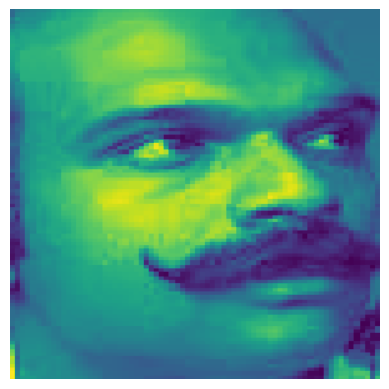

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.18863705


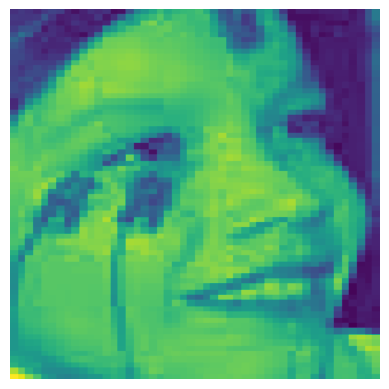

Label:  happiness
Previsão:  happiness
Probabilidade:  0.19849513


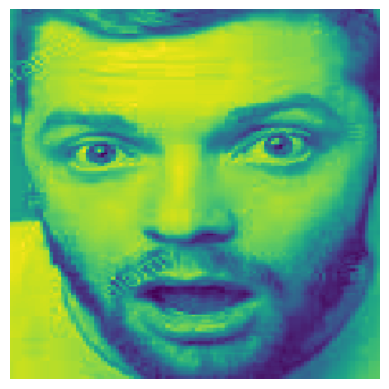

Label:  surprise
Previsão:  happiness
Probabilidade:  0.21226956


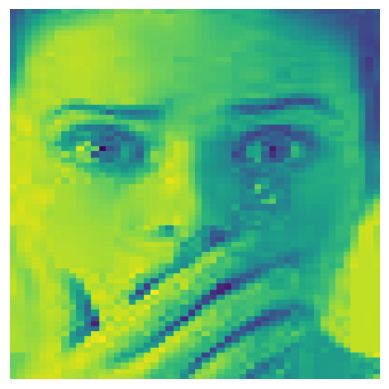

Label:  surprise
Previsão:  happiness
Probabilidade:  0.21638955


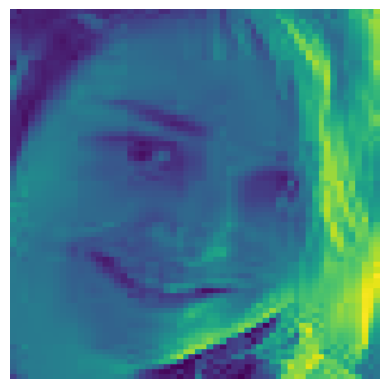

Label:  sadness
Previsão:  happiness
Probabilidade:  0.17882551


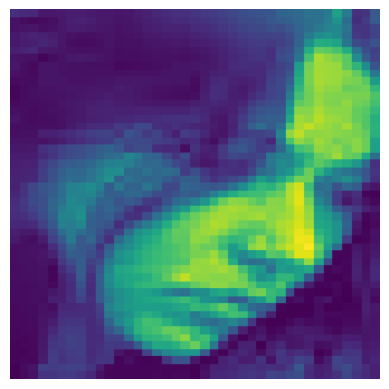

Label:  anger
Previsão:  happiness
Probabilidade:  0.1747469


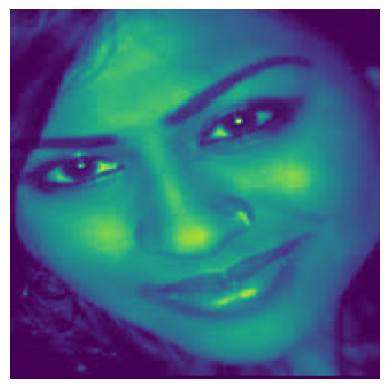

Label:  happiness
Previsão:  happiness
Probabilidade:  0.17706087


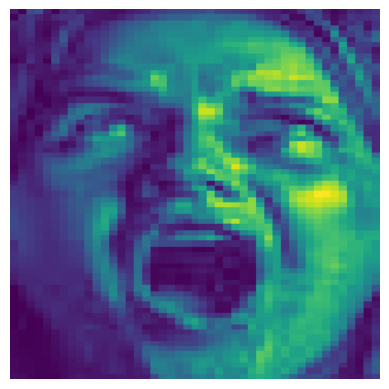

Label:  anger
Previsão:  happiness
Probabilidade:  0.17580879


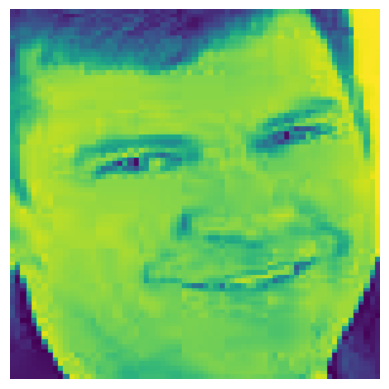

Label:  happiness
Previsão:  happiness
Probabilidade:  0.22534595


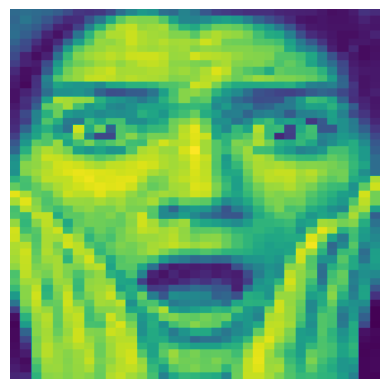

Label:  fear
Previsão:  happiness
Probabilidade:  0.2099359


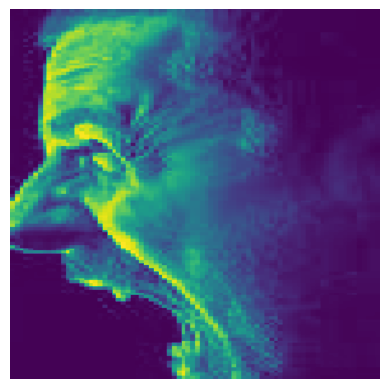

Label:  anger
Previsão:  happiness
Probabilidade:  0.17382151


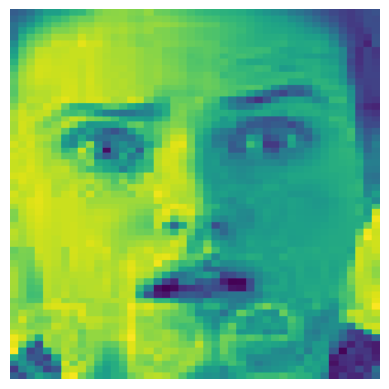

Label:  surprise
Previsão:  happiness
Probabilidade:  0.21457985


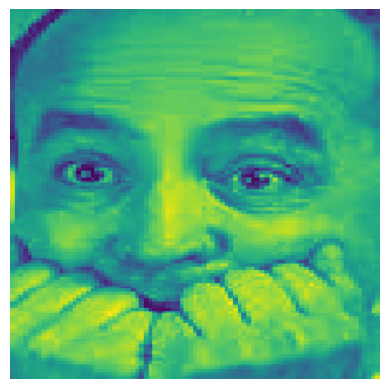

Label:  fear
Previsão:  happiness
Probabilidade:  0.20814078


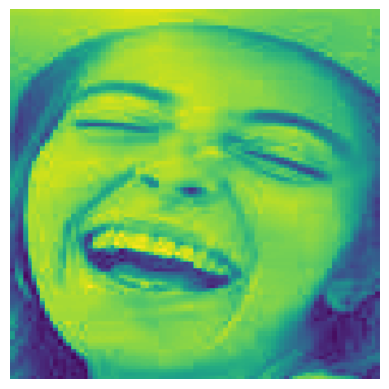

Label:  happiness
Previsão:  happiness
Probabilidade:  0.21377343


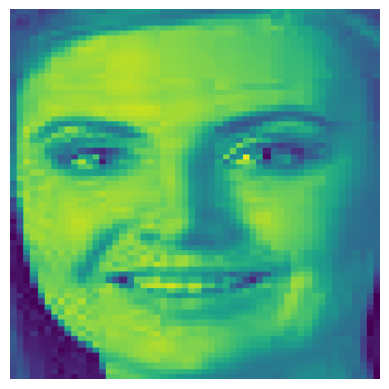

Label:  happiness
Previsão:  happiness
Probabilidade:  0.21317375


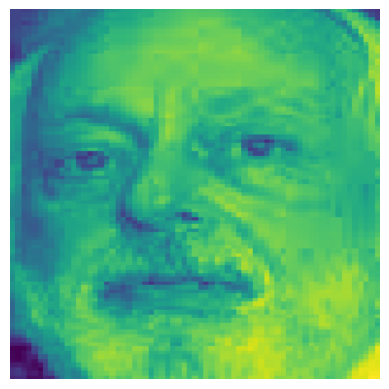

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.20900856


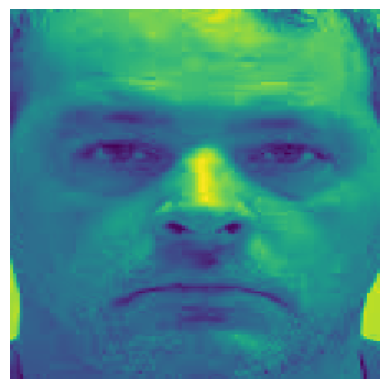

Label:  sadness
Previsão:  happiness
Probabilidade:  0.1751985


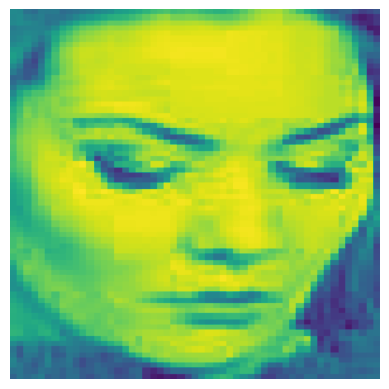

Label:  sadness
Previsão:  happiness
Probabilidade:  0.22866122


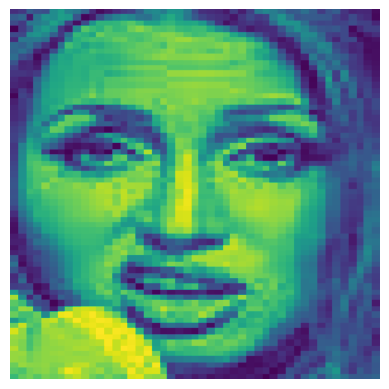

Label:  contempt
Previsão:  happiness
Probabilidade:  0.2102834


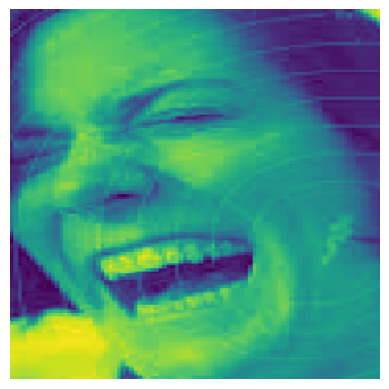

Label:  happiness
Previsão:  happiness
Probabilidade:  0.19975977


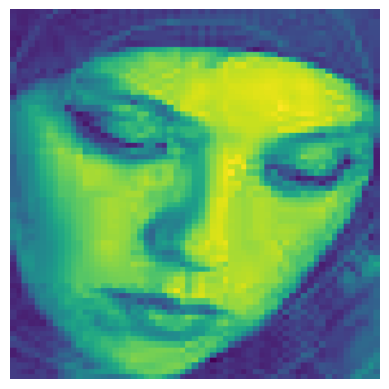

Label:  sadness
Previsão:  happiness
Probabilidade:  0.20688212


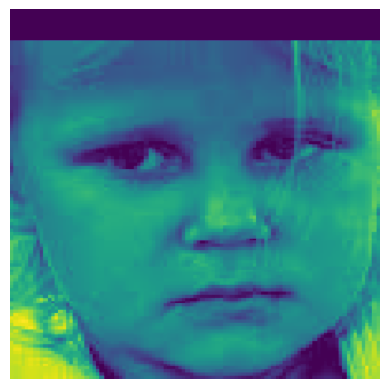

Label:  anger
Previsão:  happiness
Probabilidade:  0.18415958


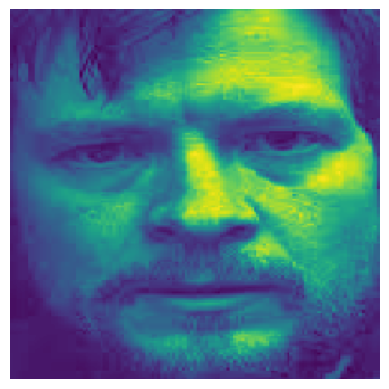

Label:  anger
Previsão:  happiness
Probabilidade:  0.18582398


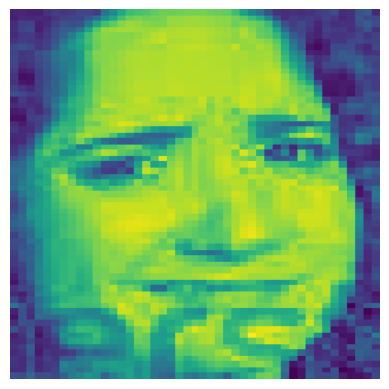

Label:  disgust
Previsão:  happiness
Probabilidade:  0.21329579


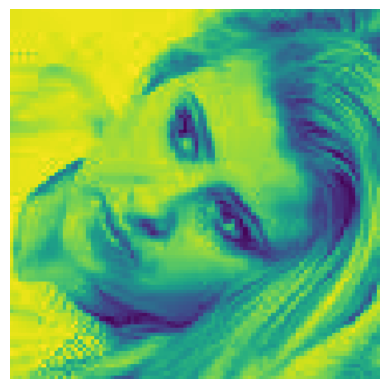

Label:  sadness
Previsão:  happiness
Probabilidade:  0.2200994


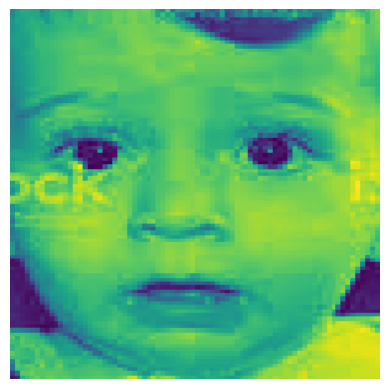

Label:  surprise
Previsão:  happiness
Probabilidade:  0.20773086


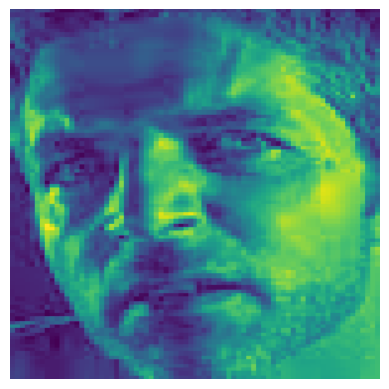

Label:  anger
Previsão:  happiness
Probabilidade:  0.18869221


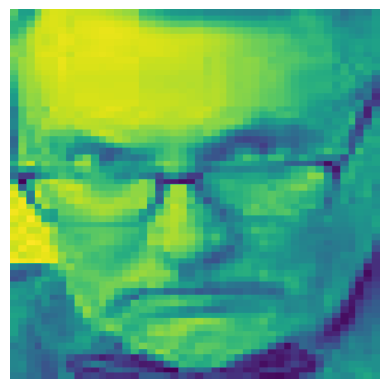

Label:  anger
Previsão:  happiness
Probabilidade:  0.2168701


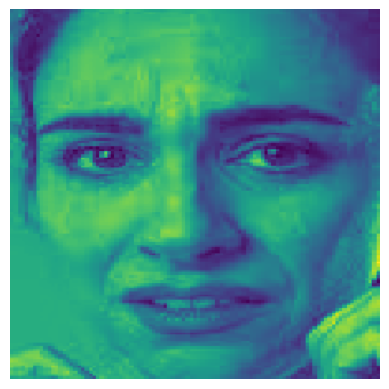

Label:  sadness
Previsão:  happiness
Probabilidade:  0.190224


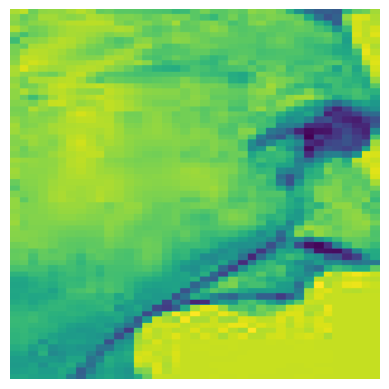

Label:  anger
Previsão:  happiness
Probabilidade:  0.22372031


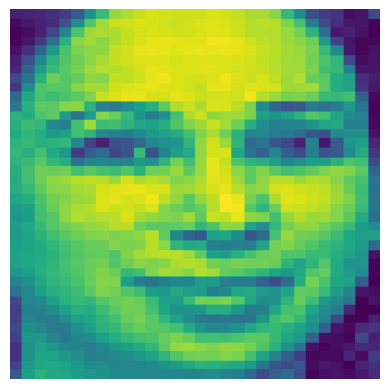

Label:  happiness
Previsão:  happiness
Probabilidade:  0.21280697


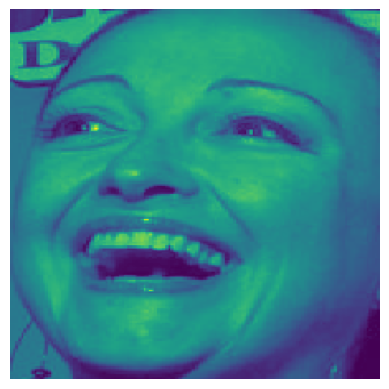

Label:  happiness
Previsão:  happiness
Probabilidade:  0.19307397
1/1 [==============================] - 3s 3s/step


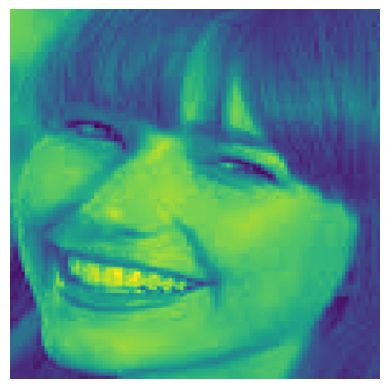

Label:  happiness
Previsão:  happiness
Probabilidade:  0.19723922


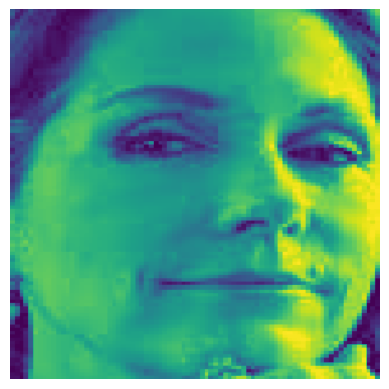

Label:  contempt
Previsão:  happiness
Probabilidade:  0.20700656


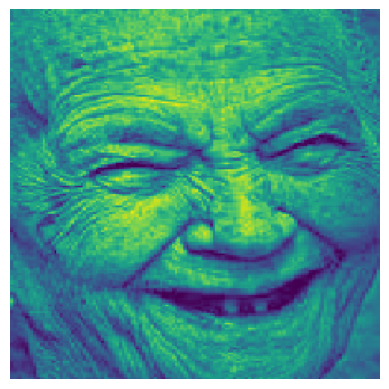

Label:  happiness
Previsão:  happiness
Probabilidade:  0.20933098


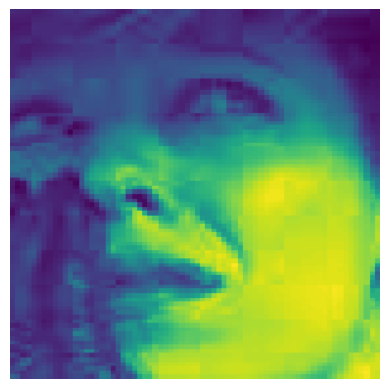

Label:  sadness
Previsão:  happiness
Probabilidade:  0.1785346


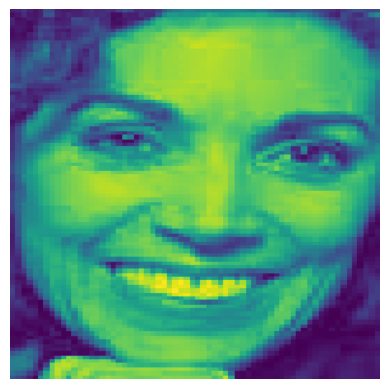

Label:  happiness
Previsão:  happiness
Probabilidade:  0.20867042


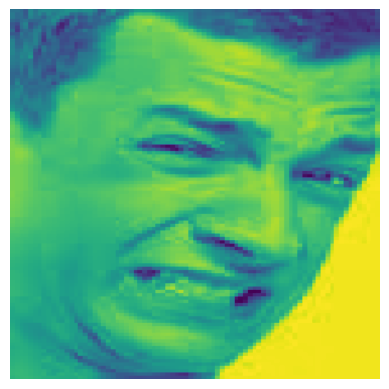

Label:  disgust
Previsão:  happiness
Probabilidade:  0.218725


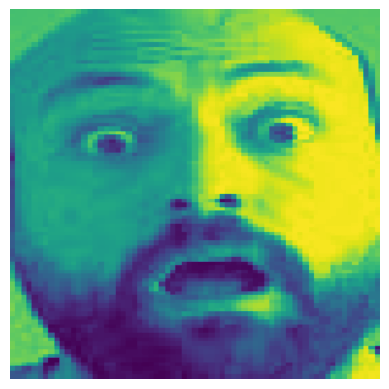

Label:  sadness
Previsão:  happiness
Probabilidade:  0.20721386


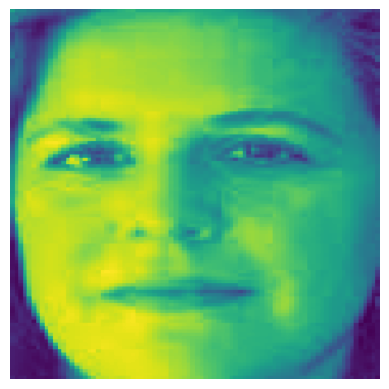

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.21504125


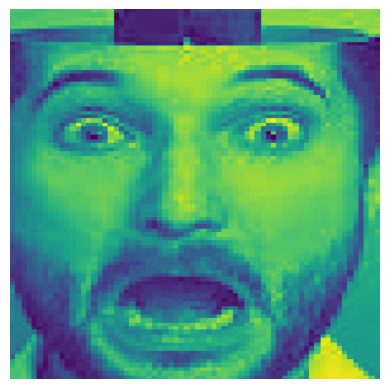

Label:  fear
Previsão:  happiness
Probabilidade:  0.20775087


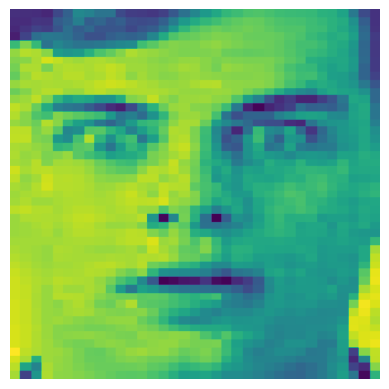

Label:  fear
Previsão:  happiness
Probabilidade:  0.21587096


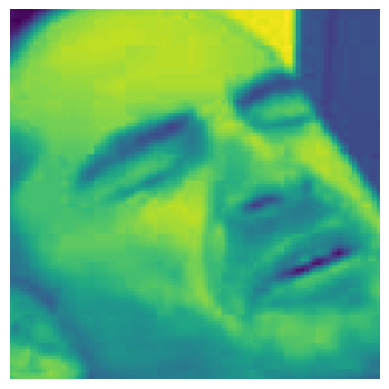

Label:  disgust
Previsão:  happiness
Probabilidade:  0.21047798


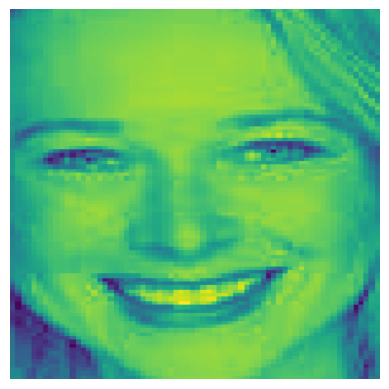

Label:  happiness
Previsão:  happiness
Probabilidade:  0.22451039


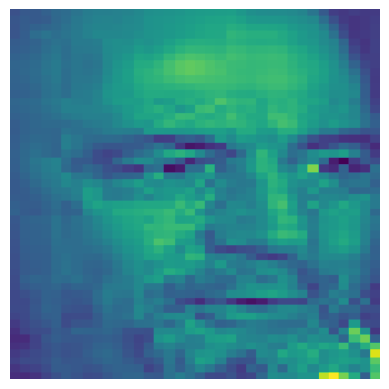

Label:  anger
Previsão:  happiness
Probabilidade:  0.19120103


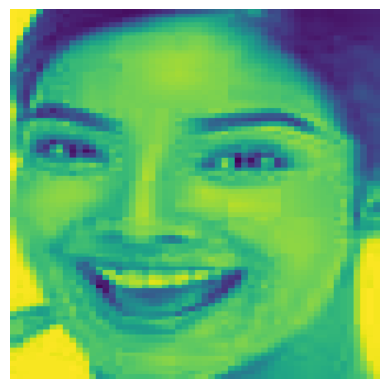

Label:  happiness
Previsão:  happiness
Probabilidade:  0.21917409


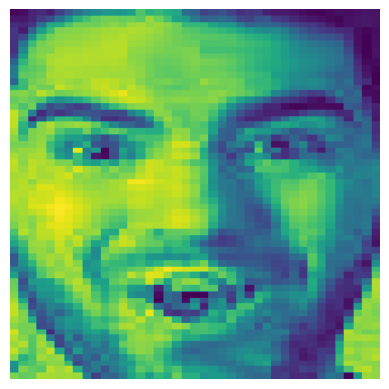

Label:  surprise
Previsão:  happiness
Probabilidade:  0.19735597


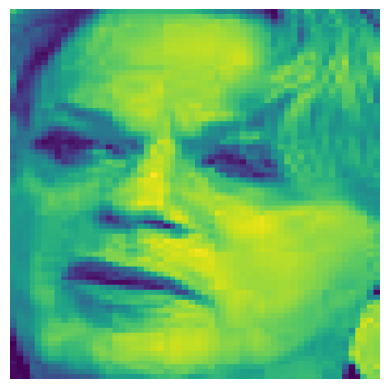

Label:  anger
Previsão:  happiness
Probabilidade:  0.20746054


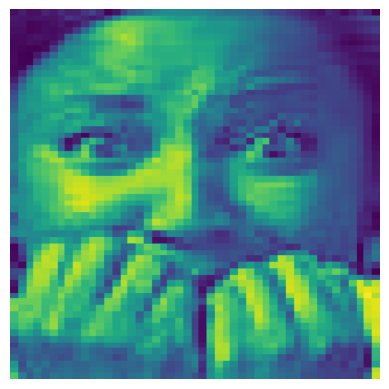

Label:  fear
Previsão:  happiness
Probabilidade:  0.2021153


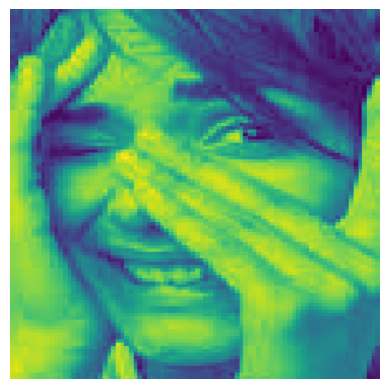

Label:  fear
Previsão:  happiness
Probabilidade:  0.20720413


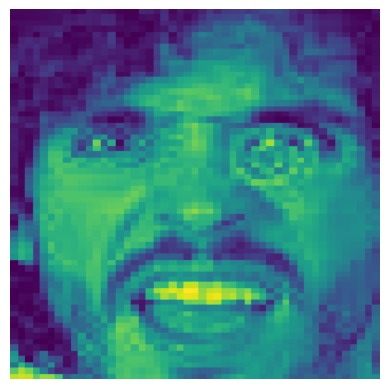

Label:  anger
Previsão:  happiness
Probabilidade:  0.19013351


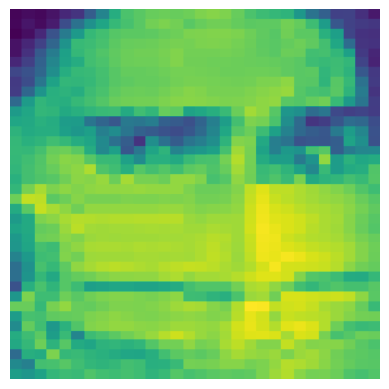

Label:  fear
Previsão:  happiness
Probabilidade:  0.21898638


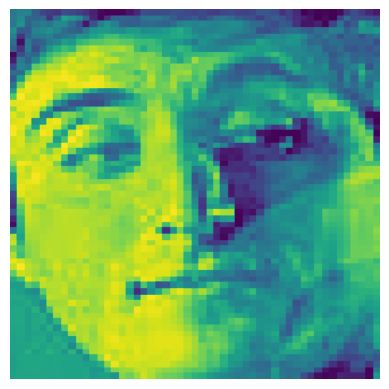

Label:  contempt
Previsão:  happiness
Probabilidade:  0.214047


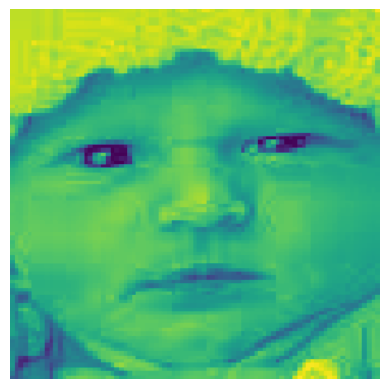

Label:  fear
Previsão:  happiness
Probabilidade:  0.20821713


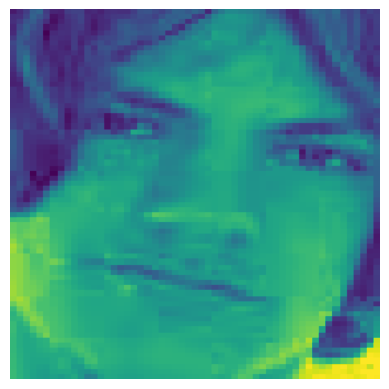

Label:  contempt
Previsão:  happiness
Probabilidade:  0.20084806


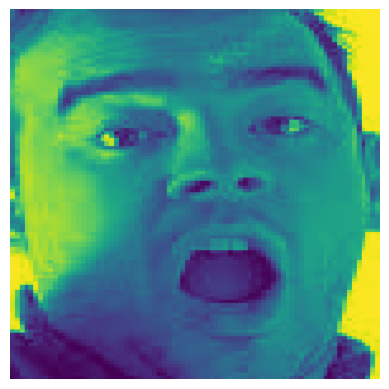

Label:  fear
Previsão:  happiness
Probabilidade:  0.19368248


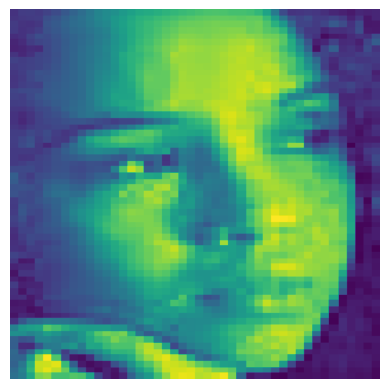

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.20000774


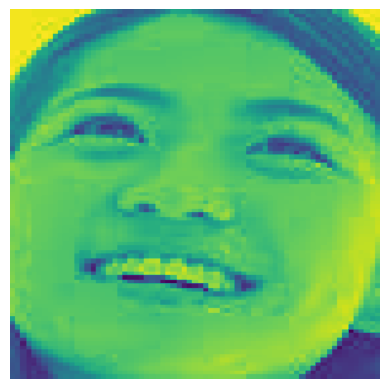

Label:  happiness
Previsão:  happiness
Probabilidade:  0.22120373


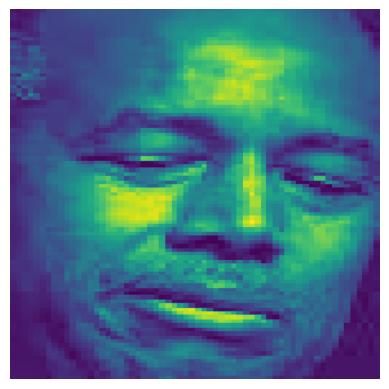

Label:  sadness
Previsão:  happiness
Probabilidade:  0.18193337


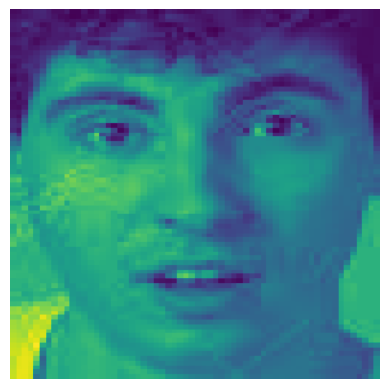

Label:  surprise
Previsão:  happiness
Probabilidade:  0.18354473


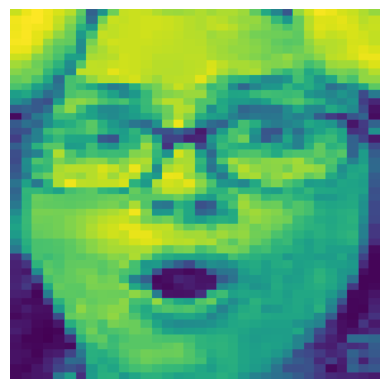

Label:  surprise
Previsão:  happiness
Probabilidade:  0.21026276


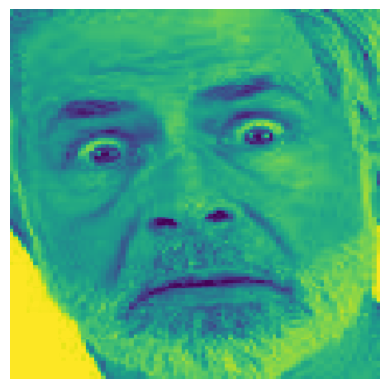

Label:  surprise
Previsão:  happiness
Probabilidade:  0.21111475


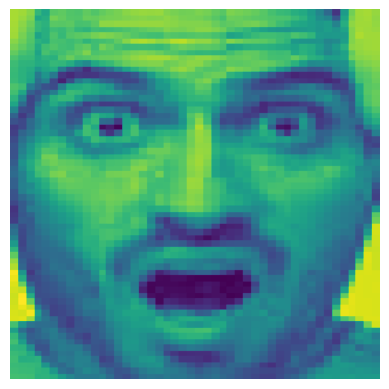

Label:  surprise
Previsão:  happiness
Probabilidade:  0.20071565


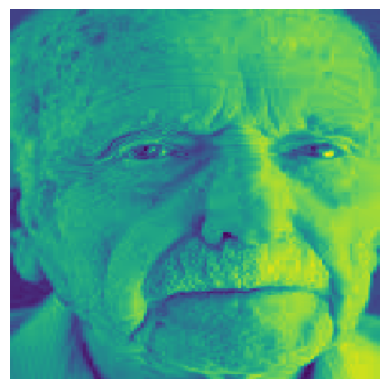

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.21034645


In [23]:
count = 0
y_pred = list()
y_true = list()
class_names = ['anger','contempt','disgust','fear','happiness','neutrality','sadness','surprise']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 3:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[np.argmax(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            dict_class={
                0: 'anger',
                1: 'contempt',
                2: 'disgust',
                3: 'fear',
                4: 'happiness',
                5: 'neutrality',
                6: 'sadness',
                7: 'surprise'
            }


            class_name = dict_class.get(predicted_class)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

In [24]:
# Calculando as métricas
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.21875
Precision:  0.0478515625
Recall:  0.21875
F1 Score:  0.07852564102564102


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [25]:
len(y_pred)

64

In [26]:
len(y_true)

64

In [27]:
class_names

['anger',
 'contempt',
 'disgust',
 'fear',
 'happiness',
 'neutrality',
 'sadness',
 'surprise']

Matriz de confusão sem normalização


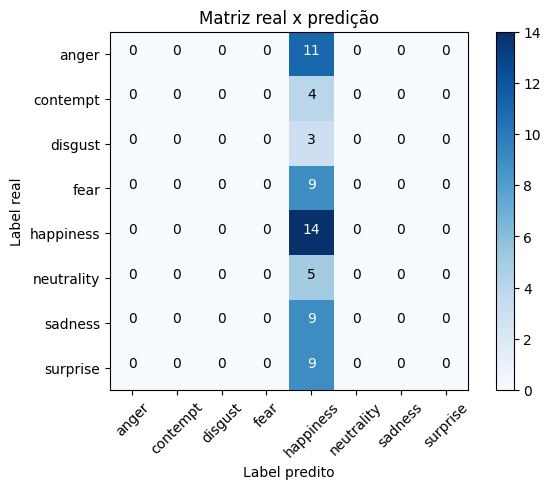

In [28]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['anger',
                               'contempt',
                               'disgust',
                               'fear',
                               'happiness',
                               'neutrality',
                               'sadness',
                               'surprise'],
                      normalize= False,
                      title='Matriz real x predição')

In [146]:
cnf_matrix

array([[ 0,  0,  0,  0, 21,  0,  0,  0],
       [ 0,  0,  0,  0,  5,  0,  0,  0],
       [ 0,  0,  0,  0, 12,  0,  0,  0],
       [ 0,  0,  0,  0, 15,  0,  0,  0],
       [ 0,  0,  0,  0, 36,  0,  0,  0],
       [ 0,  0,  0,  0,  9,  0,  0,  0],
       [ 0,  0,  0,  0, 16,  0,  0,  0],
       [ 0,  0,  0,  0, 14,  0,  0,  0]])

In [44]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'dataset/emotions/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-23T2003.h5


In [45]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-07-23T2003.h5 carregado com sucesso


2/2 [==============================] - 2s 510ms/step


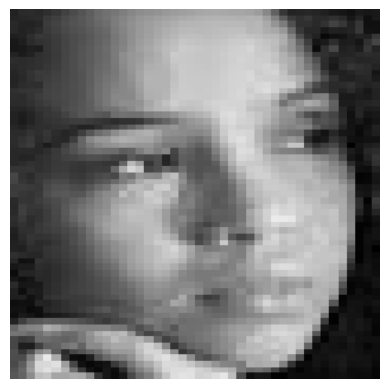

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.33203456


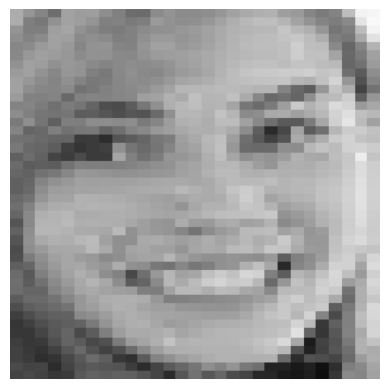

Label:  happiness
Previsão:  happiness
Probabilidade:  0.28658596


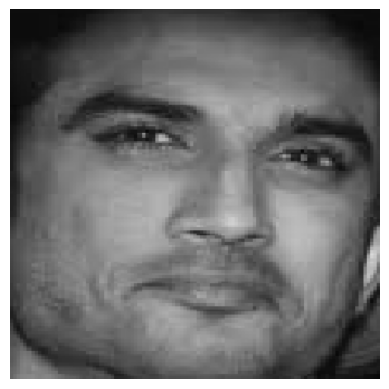

Label:  sadness
Previsão:  happiness
Probabilidade:  0.30850017


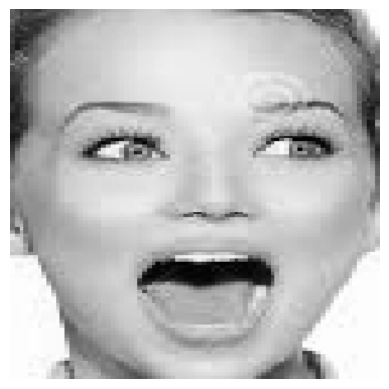

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2989564


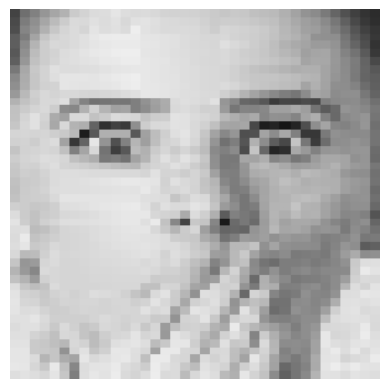

Label:  surprise
Previsão:  happiness
Probabilidade:  0.29849258


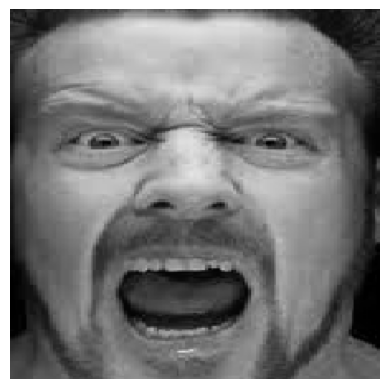

Label:  anger
Previsão:  happiness
Probabilidade:  0.2796185


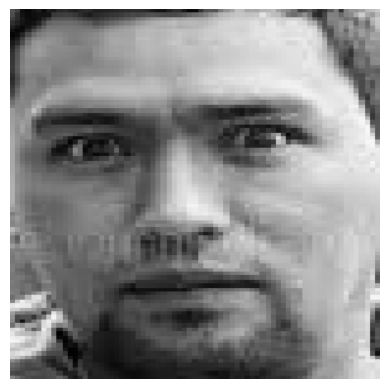

Label:  surprise
Previsão:  happiness
Probabilidade:  0.2639202


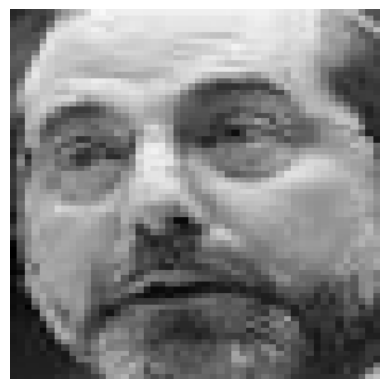

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.27441153


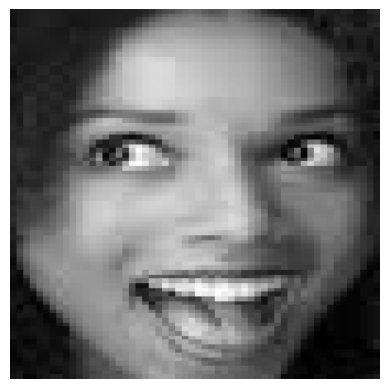

Label:  surprise
Previsão:  happiness
Probabilidade:  0.37324858


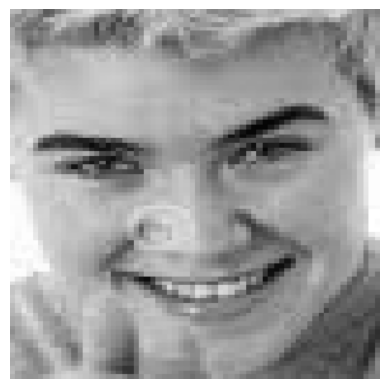

Label:  happiness
Previsão:  happiness
Probabilidade:  0.28884727


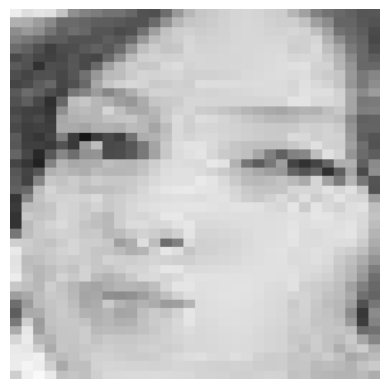

Label:  surprise
Previsão:  happiness
Probabilidade:  0.29775703


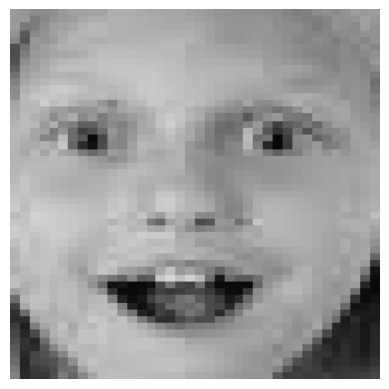

Label:  surprise
Previsão:  happiness
Probabilidade:  0.2883691


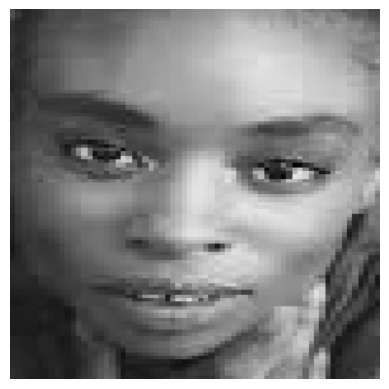

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.29157668


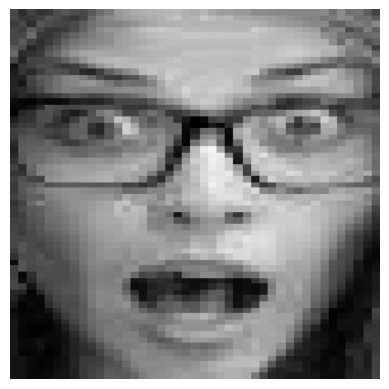

Label:  fear
Previsão:  happiness
Probabilidade:  0.30885732


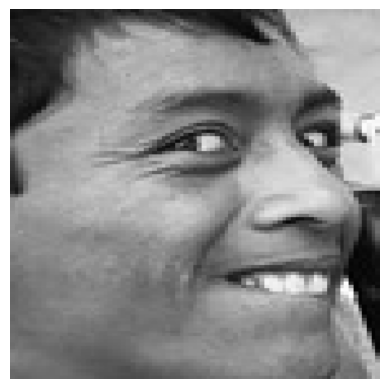

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2985528


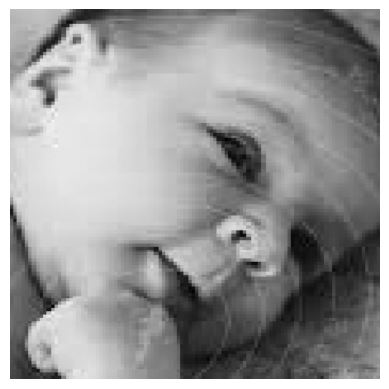

Label:  happiness
Previsão:  happiness
Probabilidade:  0.279694


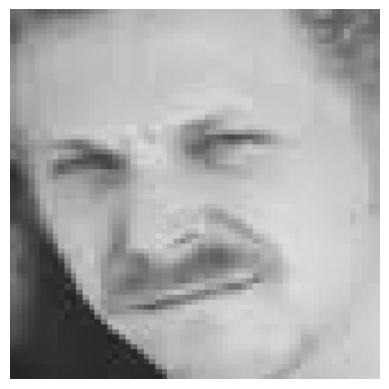

Label:  contempt
Previsão:  happiness
Probabilidade:  0.28924248


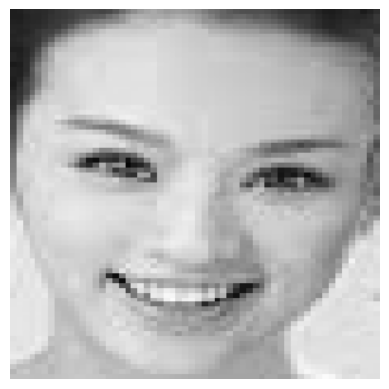

Label:  happiness
Previsão:  happiness
Probabilidade:  0.30540594


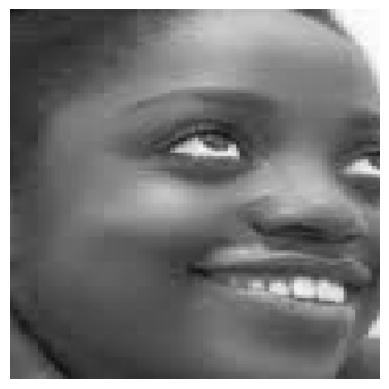

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2735483


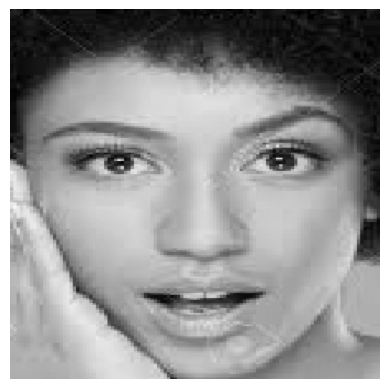

Label:  surprise
Previsão:  happiness
Probabilidade:  0.33605474


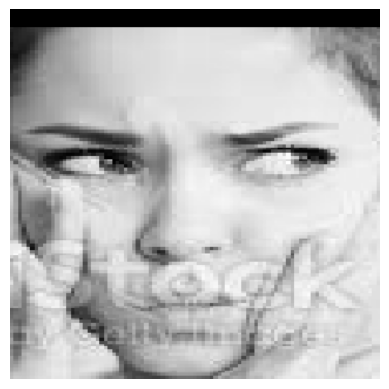

Label:  sadness
Previsão:  happiness
Probabilidade:  0.30838463


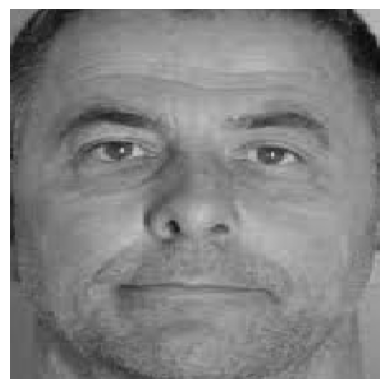

Label:  contempt
Previsão:  happiness
Probabilidade:  0.2737231


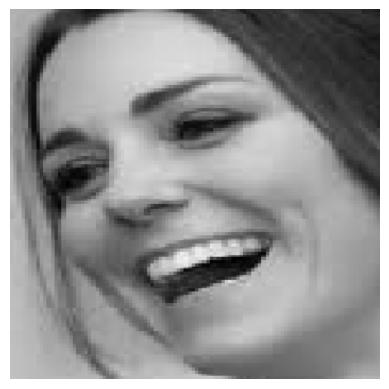

Label:  happiness
Previsão:  happiness
Probabilidade:  0.29840872


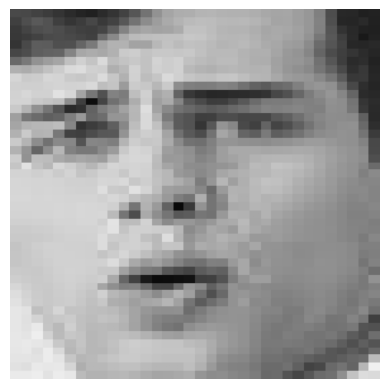

Label:  fear
Previsão:  happiness
Probabilidade:  0.2835389


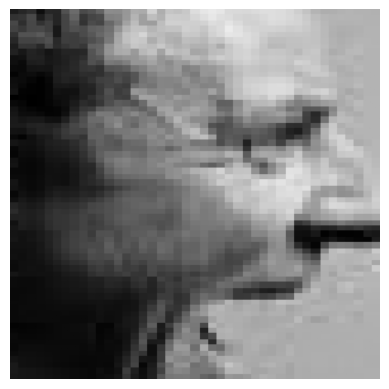

Label:  anger
Previsão:  happiness
Probabilidade:  0.34315214


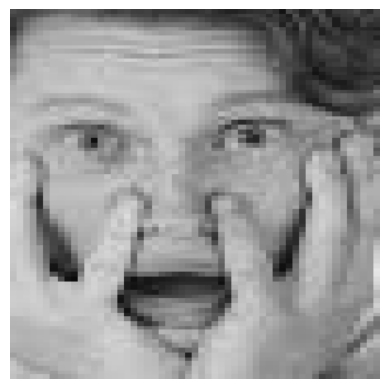

Label:  fear
Previsão:  happiness
Probabilidade:  0.29147804


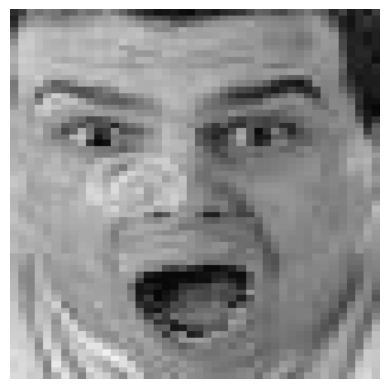

Label:  fear
Previsão:  happiness
Probabilidade:  0.27072626


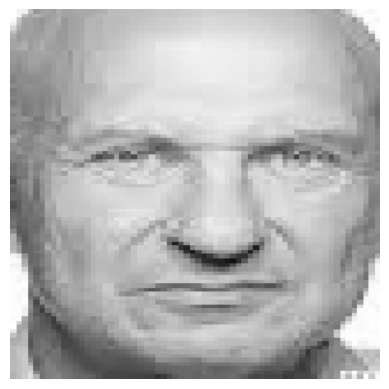

Label:  anger
Previsão:  happiness
Probabilidade:  0.29609555


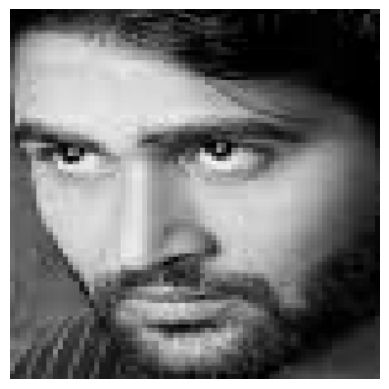

Label:  anger
Previsão:  happiness
Probabilidade:  0.29591188


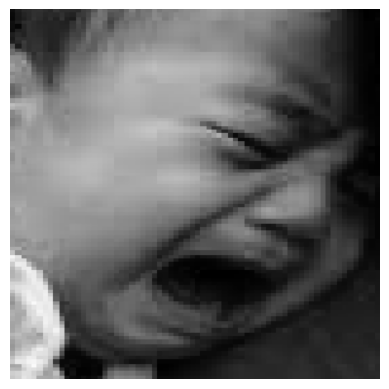

Label:  sadness
Previsão:  sadness
Probabilidade:  0.20680407


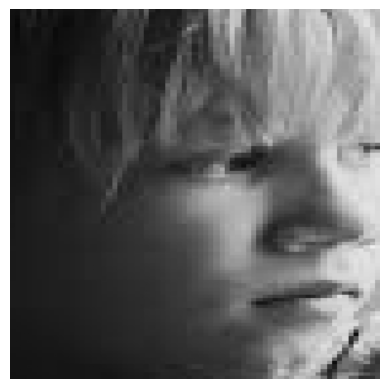

Label:  sadness
Previsão:  happiness
Probabilidade:  0.3209846


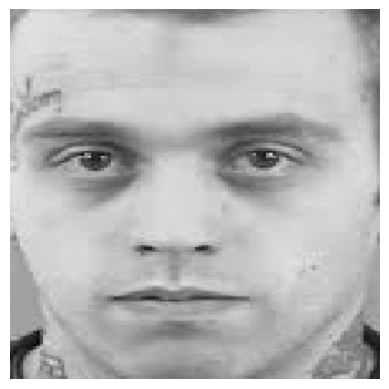

Label:  anger
Previsão:  happiness
Probabilidade:  0.29141894


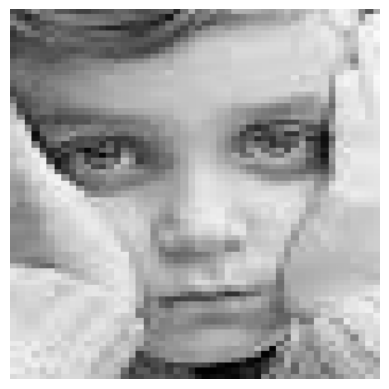

Label:  sadness
Previsão:  happiness
Probabilidade:  0.29460436


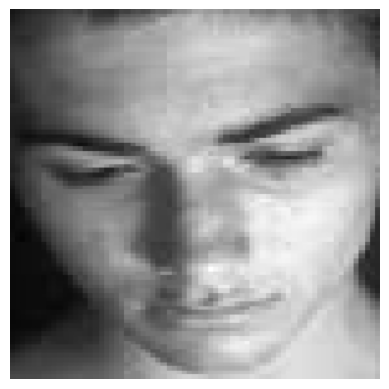

Label:  sadness
Previsão:  happiness
Probabilidade:  0.30483487


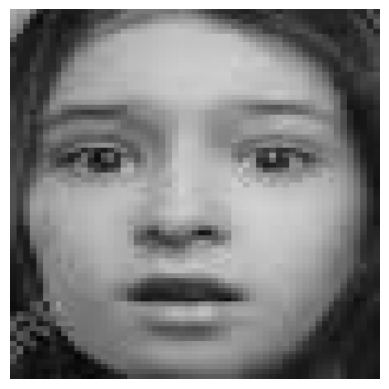

Label:  fear
Previsão:  happiness
Probabilidade:  0.31495732


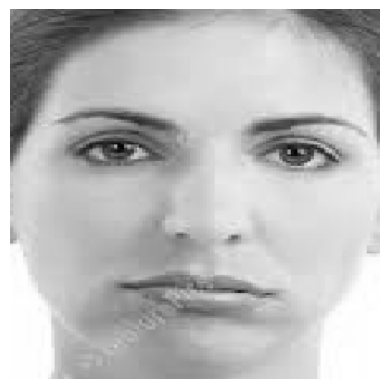

Label:  sadness
Previsão:  happiness
Probabilidade:  0.29081696


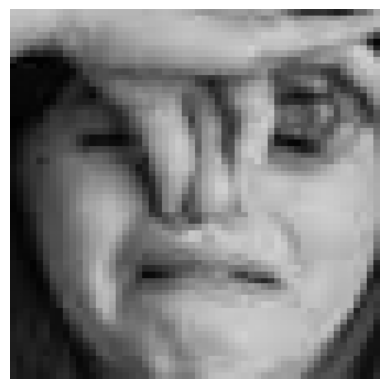

Label:  disgust
Previsão:  happiness
Probabilidade:  0.32916358


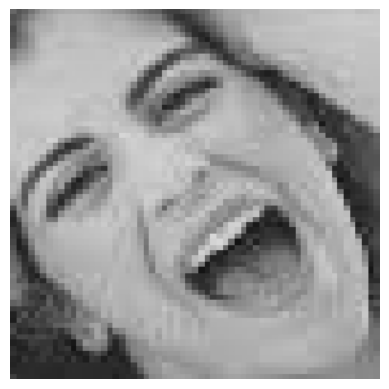

Label:  anger
Previsão:  happiness
Probabilidade:  0.2834485


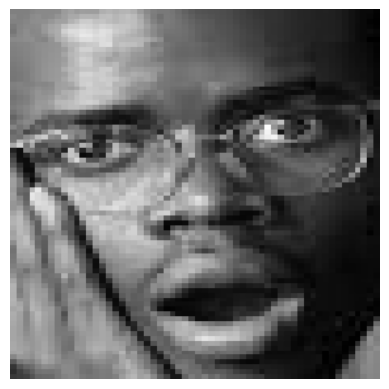

Label:  fear
Previsão:  happiness
Probabilidade:  0.2654227


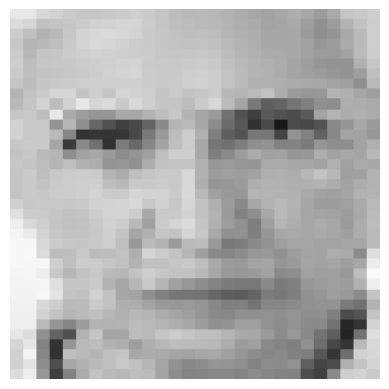

Label:  anger
Previsão:  happiness
Probabilidade:  0.2815356


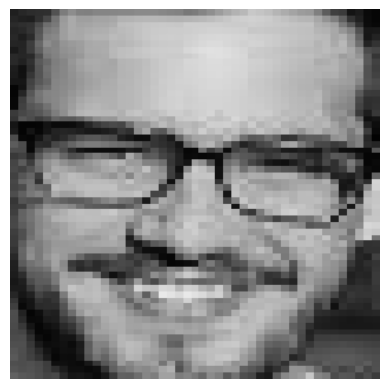

Label:  happiness
Previsão:  happiness
Probabilidade:  0.31324732


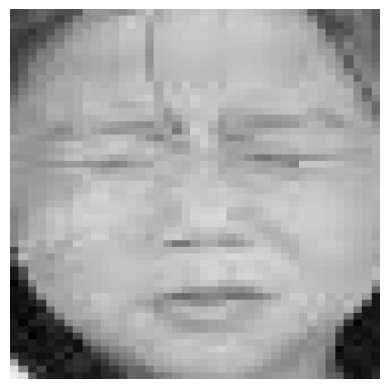

Label:  disgust
Previsão:  happiness
Probabilidade:  0.29391667


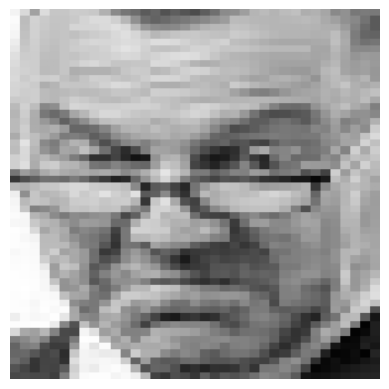

Label:  disgust
Previsão:  happiness
Probabilidade:  0.28823364


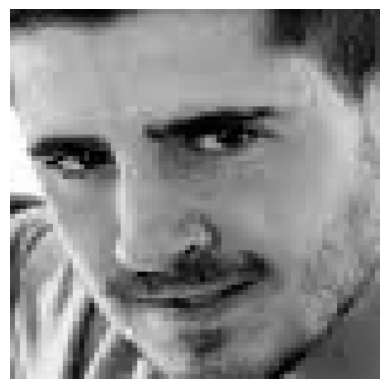

Label:  anger
Previsão:  happiness
Probabilidade:  0.2823891


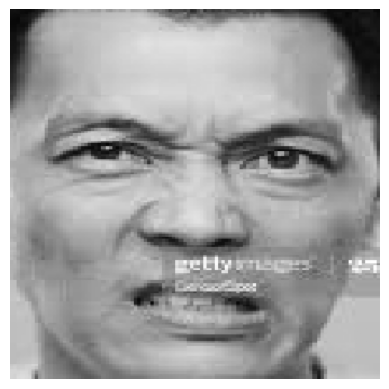

Label:  disgust
Previsão:  happiness
Probabilidade:  0.2993103


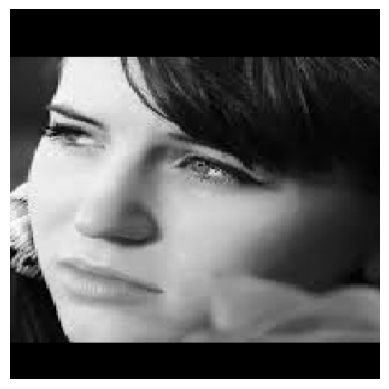

Label:  sadness
Previsão:  happiness
Probabilidade:  0.24381803


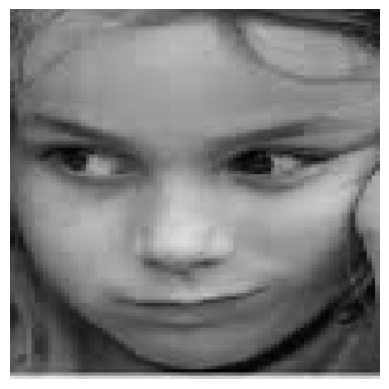

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.27909818


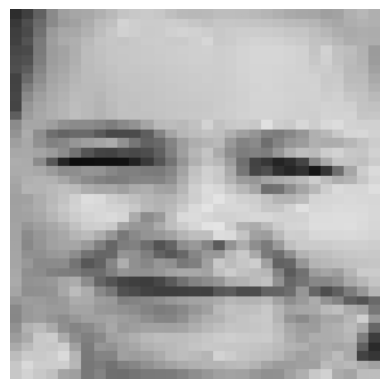

Label:  happiness
Previsão:  happiness
Probabilidade:  0.28713593


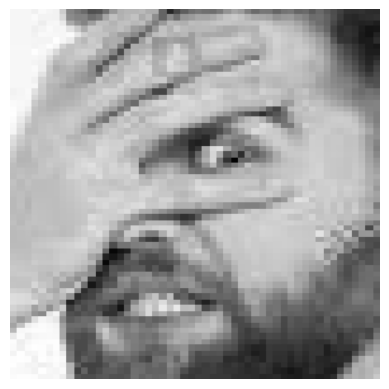

Label:  fear
Previsão:  happiness
Probabilidade:  0.29385033


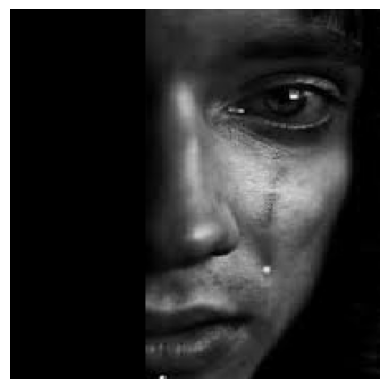

Label:  sadness
Previsão:  sadness
Probabilidade:  0.3812373
2/2 [==============================] - 2s 516ms/step


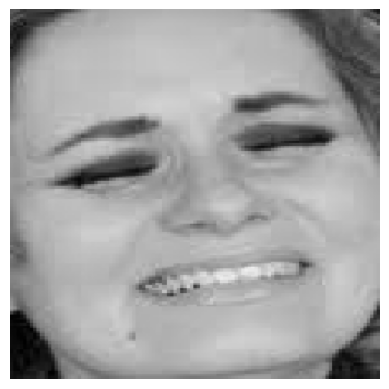

Label:  sadness
Previsão:  happiness
Probabilidade:  0.290153


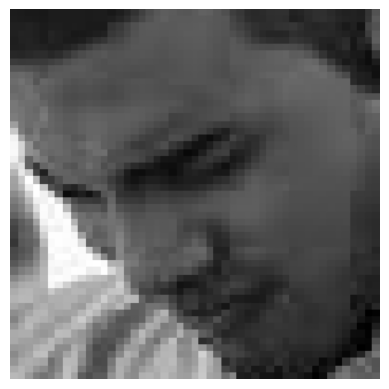

Label:  anger
Previsão:  happiness
Probabilidade:  0.25276607


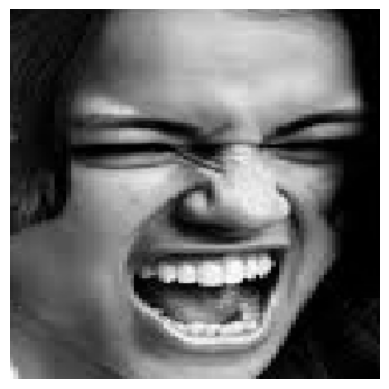

Label:  anger
Previsão:  happiness
Probabilidade:  0.43021947


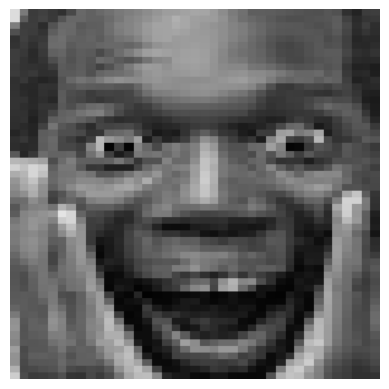

Label:  surprise
Previsão:  happiness
Probabilidade:  0.25624716


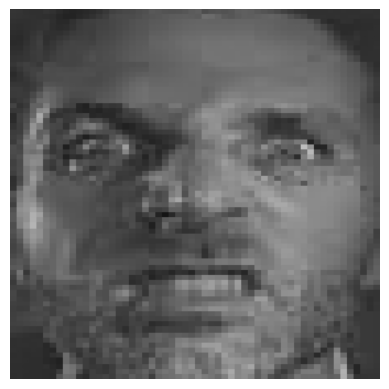

Label:  anger
Previsão:  happiness
Probabilidade:  0.26851496


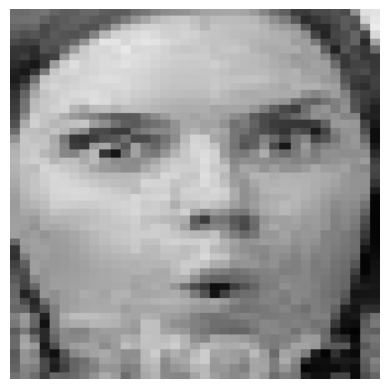

Label:  surprise
Previsão:  happiness
Probabilidade:  0.2842679


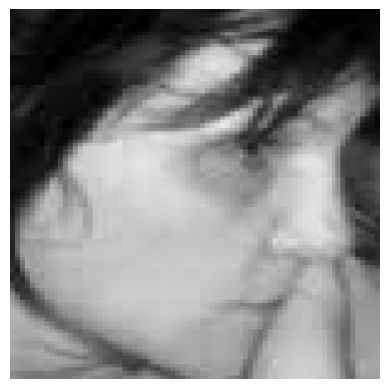

Label:  sadness
Previsão:  happiness
Probabilidade:  0.3645181


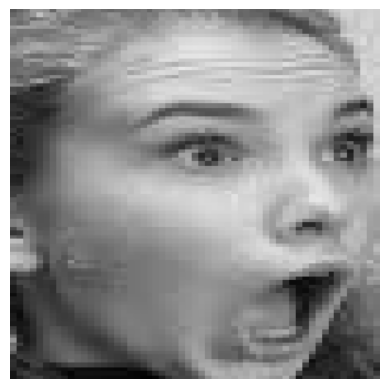

Label:  surprise
Previsão:  happiness
Probabilidade:  0.2780326


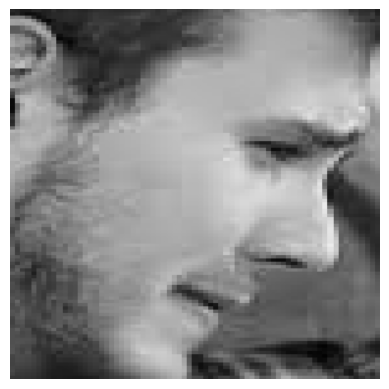

Label:  sadness
Previsão:  happiness
Probabilidade:  0.29205412


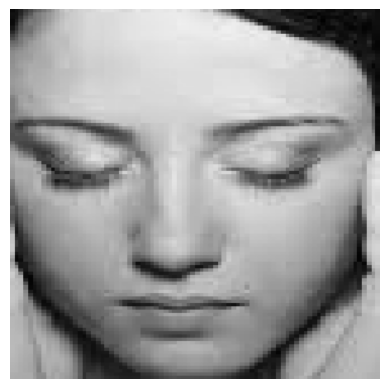

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.2873451


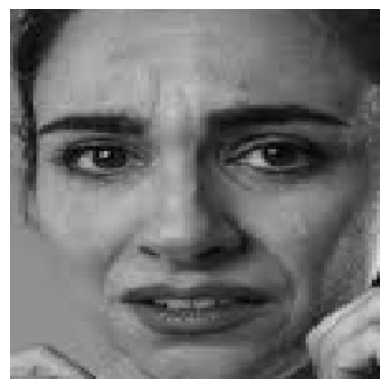

Label:  sadness
Previsão:  happiness
Probabilidade:  0.27932143


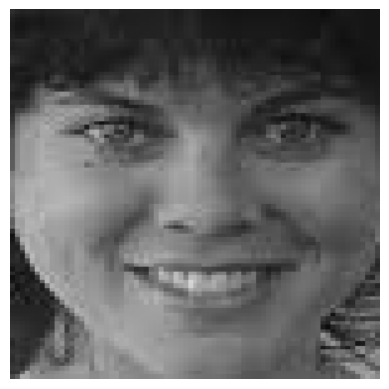

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2709293


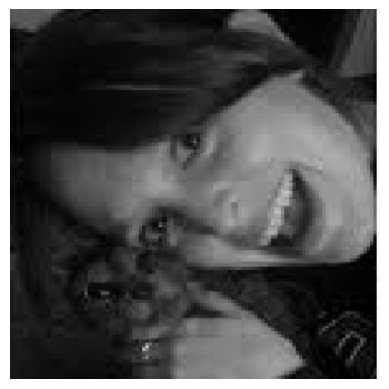

Label:  happiness
Previsão:  sadness
Probabilidade:  0.2862924


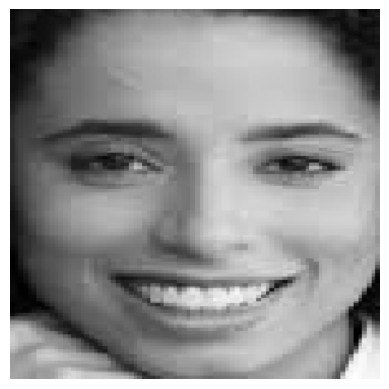

Label:  happiness
Previsão:  happiness
Probabilidade:  0.31740937


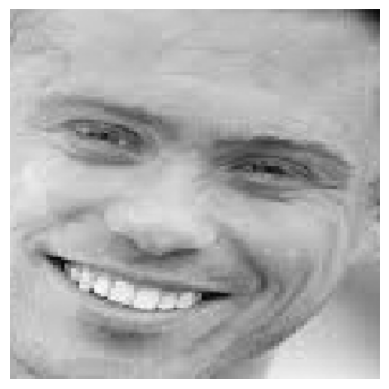

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2922028


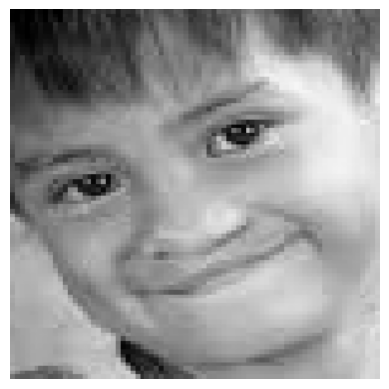

Label:  happiness
Previsão:  happiness
Probabilidade:  0.3187547


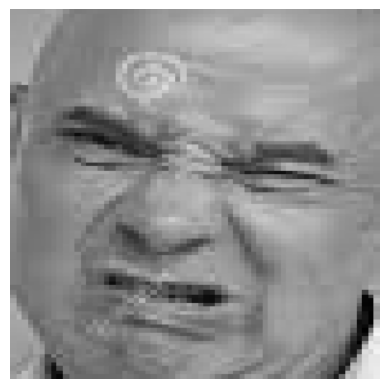

Label:  disgust
Previsão:  happiness
Probabilidade:  0.27619892


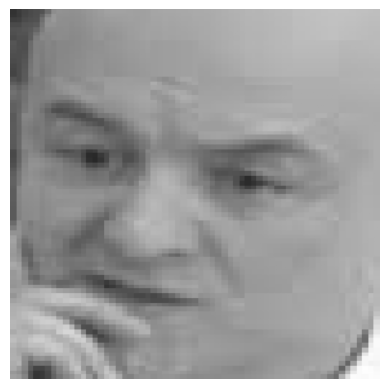

Label:  contempt
Previsão:  happiness
Probabilidade:  0.27151266


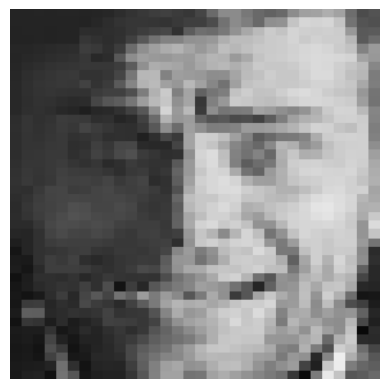

Label:  fear
Previsão:  happiness
Probabilidade:  0.32640657


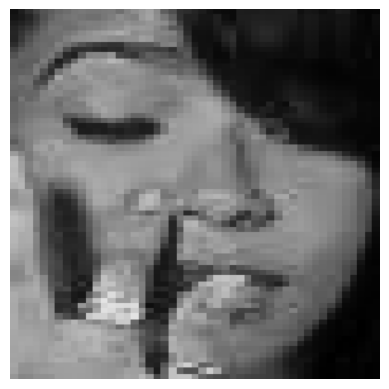

Label:  sadness
Previsão:  happiness
Probabilidade:  0.26930523


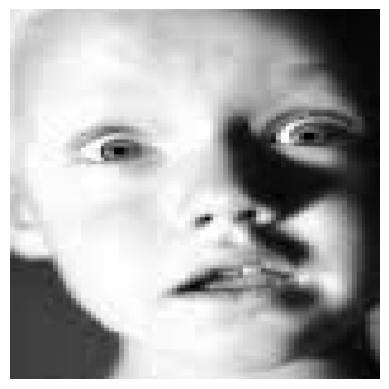

Label:  anger
Previsão:  happiness
Probabilidade:  0.34752607


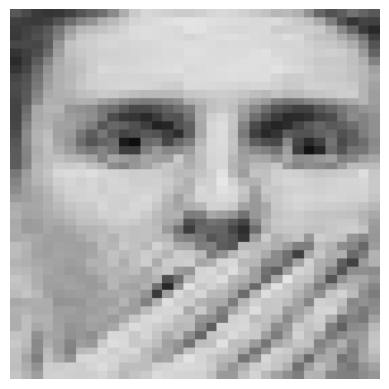

Label:  surprise
Previsão:  happiness
Probabilidade:  0.3007449


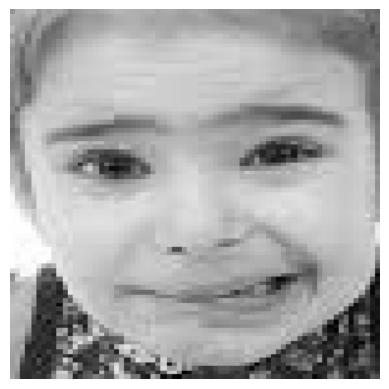

Label:  disgust
Previsão:  happiness
Probabilidade:  0.29521024


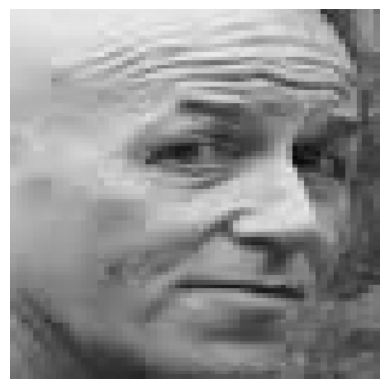

Label:  contempt
Previsão:  happiness
Probabilidade:  0.27448168


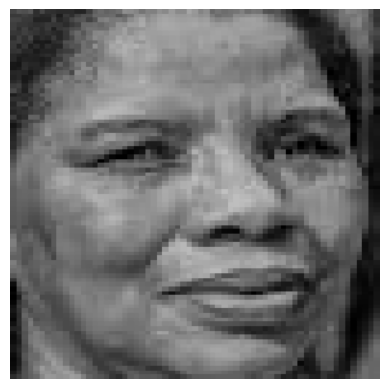

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.29412603


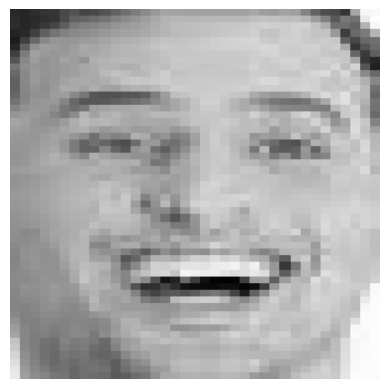

Label:  happiness
Previsão:  happiness
Probabilidade:  0.3007103


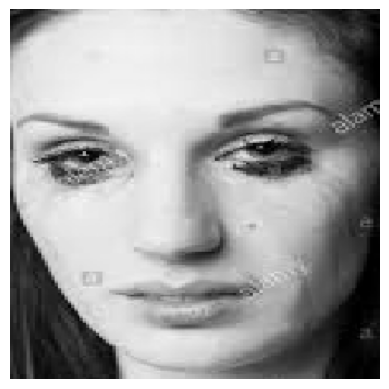

Label:  sadness
Previsão:  happiness
Probabilidade:  0.32551137


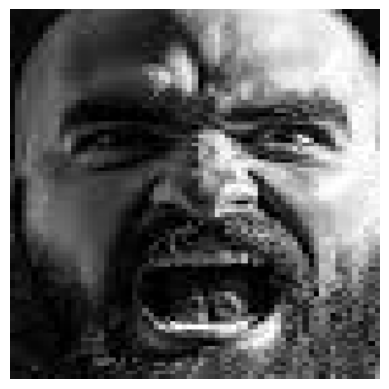

Label:  anger
Previsão:  happiness
Probabilidade:  0.29059803


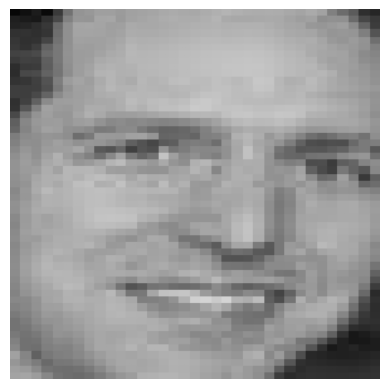

Label:  happiness
Previsão:  happiness
Probabilidade:  0.28728366


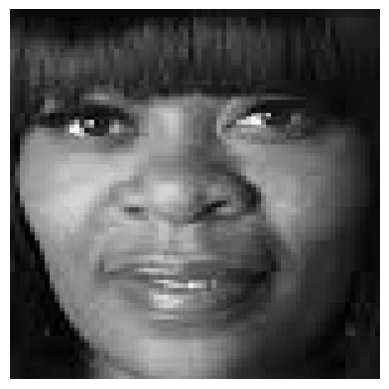

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.27342668


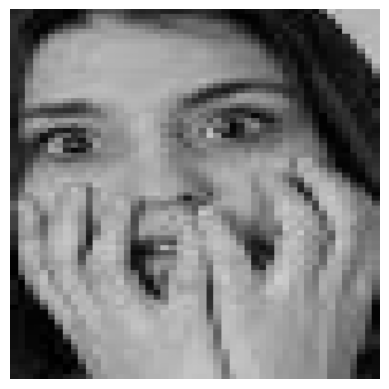

Label:  fear
Previsão:  happiness
Probabilidade:  0.31130758


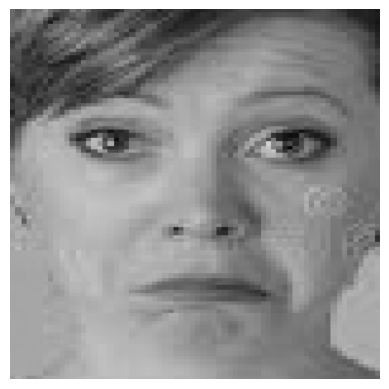

Label:  sadness
Previsão:  happiness
Probabilidade:  0.27340895


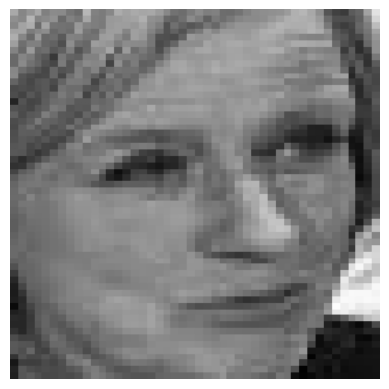

Label:  sadness
Previsão:  happiness
Probabilidade:  0.27862754


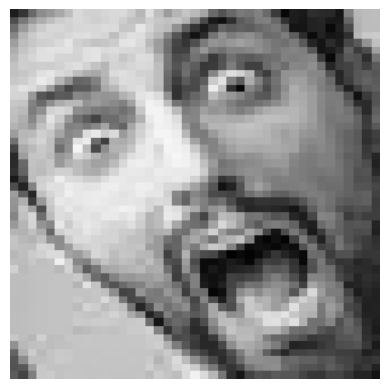

Label:  fear
Previsão:  happiness
Probabilidade:  0.29205546


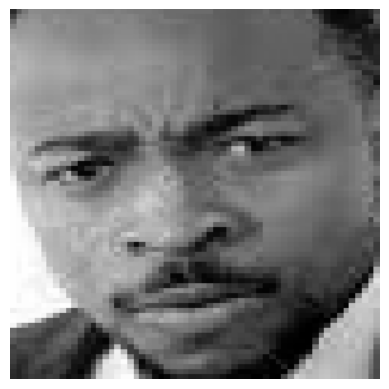

Label:  anger
Previsão:  happiness
Probabilidade:  0.27810952


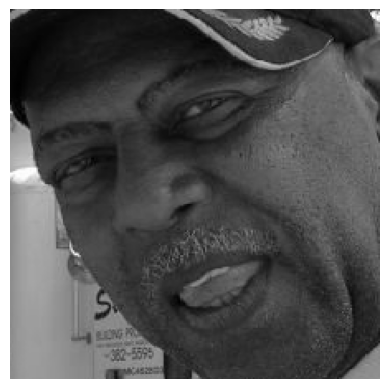

Label:  disgust
Previsão:  happiness
Probabilidade:  0.28672153


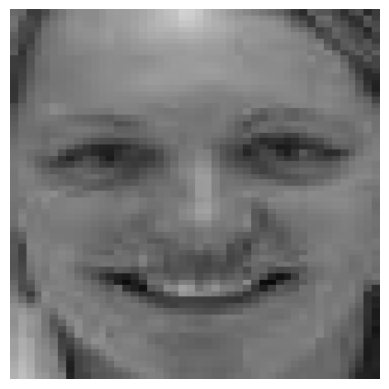

Label:  happiness
Previsão:  happiness
Probabilidade:  0.26043558


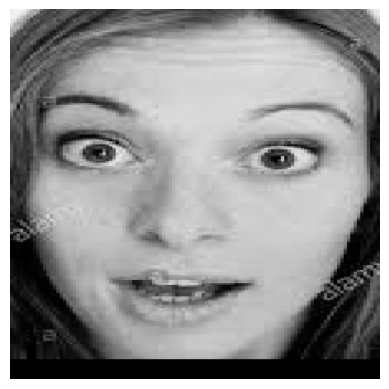

Label:  surprise
Previsão:  happiness
Probabilidade:  0.31586128


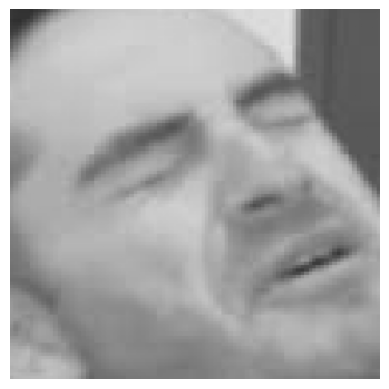

Label:  disgust
Previsão:  happiness
Probabilidade:  0.27505356


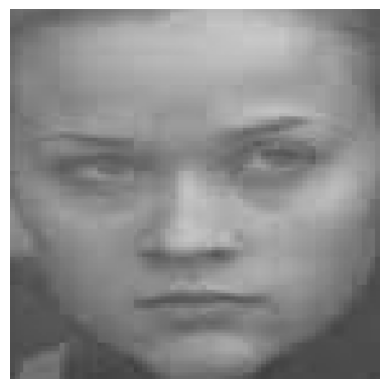

Label:  anger
Previsão:  happiness
Probabilidade:  0.26735172


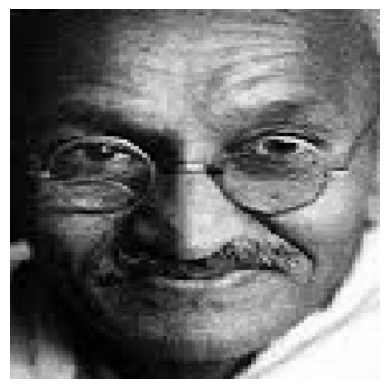

Label:  happiness
Previsão:  happiness
Probabilidade:  0.34272388


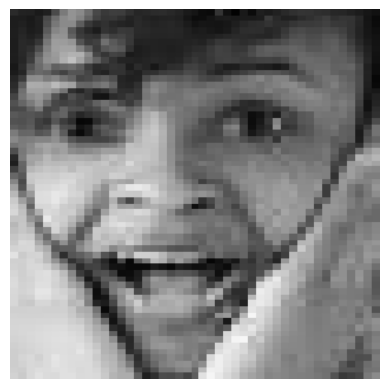

Label:  surprise
Previsão:  happiness
Probabilidade:  0.2996939


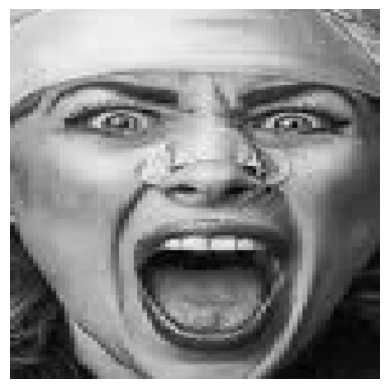

Label:  anger
Previsão:  happiness
Probabilidade:  0.31206644


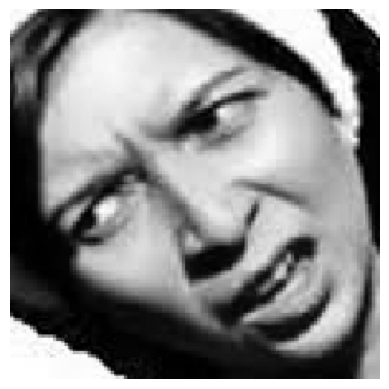

Label:  disgust
Previsão:  happiness
Probabilidade:  0.2682743


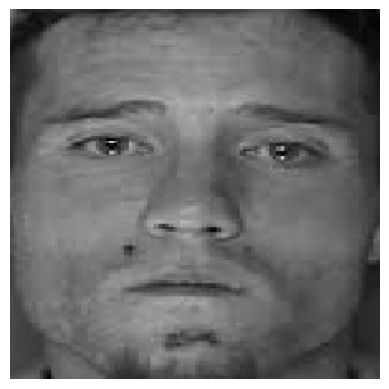

Label:  sadness
Previsão:  happiness
Probabilidade:  0.27380612


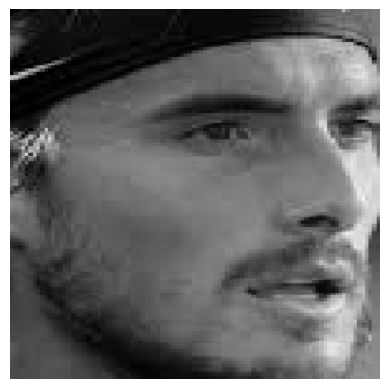

Label:  surprise
Previsão:  happiness
Probabilidade:  0.27360848


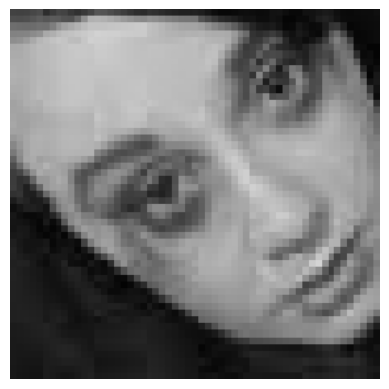

Label:  sadness
Previsão:  happiness
Probabilidade:  0.24237408


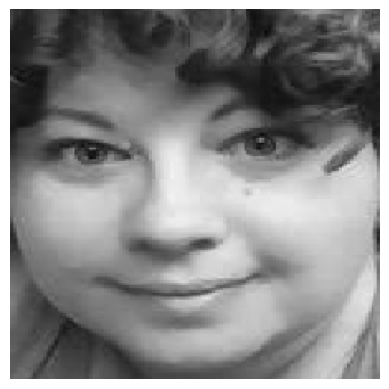

Label:  happiness
Previsão:  happiness
Probabilidade:  0.30288252


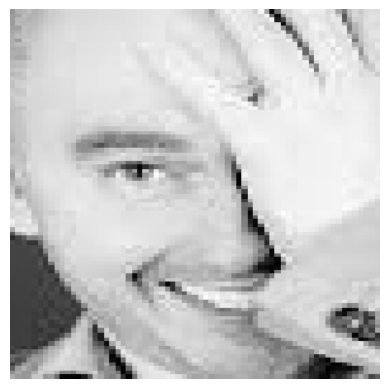

Label:  happiness
Previsão:  happiness
Probabilidade:  0.3120313


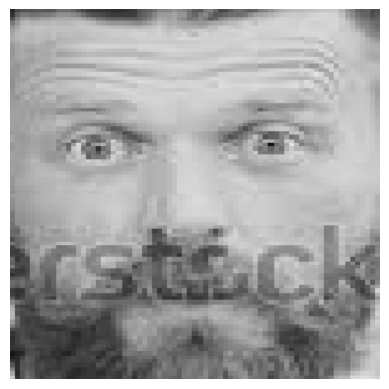

Label:  surprise
Previsão:  happiness
Probabilidade:  0.28190842


In [46]:
count = 0
y_pred = list()
y_true = list()
class_names = ['anger','contempt','disgust','fear','happiness','neutrality','sadness','surprise']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 3:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[np.argmax(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            dict_class={
                0: 'anger',
                1: 'contempt',
                2: 'disgust',
                3: 'fear',
                4: 'happiness',
                5: 'neutrality',
                6: 'sadness',
                7: 'surprise'
            }


            class_name = dict_class.get(predicted_class)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

Como o treinamento do modelo foi para fins didáticos, não foi possível treinar com um grande volume de dados e épocas, o que melhoraria a convergência e sua acurácia.